In [3]:
library(DESeq2)
library(data.table)
library(dplyr)
library(ChIPseeker)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(survminer)
library(clusterProfiler)
library(AnnotationDbi)
library(XML)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(IRdisplay)
library(pbapply)
library(ChIPpeakAnno)
library(sva)
library(TCGAbiolinks) 
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(Seurat)
library(kableExtra)
library(tidyverse)
library(clusterProfiler)
library(enrichplot)
library(readxl)
library(umap)
library(corrplot)
library(ggrepel)
library(msigdbr)
library(ggraph)
library(tidygraph)
library(fgsea)
library(ggvenn)
library(ComplexHeatmap)
library(ggVennDiagram)
library(sva)
library(DT)
library(tools)
library(tidyverse)
library(maSigPro)
library(RSQLite)
library(rstatix)

library(edgeR)

#txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene

options(width = 188)

base_dir = '~/workspace/sei_tcga_somatic'
source('~/script/utils.r')
setwd(base_dir)


# import & organize mc3 data

In [4]:
fname = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_JinWang/bcat/tcga_mc3.rds'
mc3 = readRDS(fname) 


In [5]:
mc3 = as.data.table(mc3)

In [6]:
head2(mc3)


Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome
<chr>,<dbl>,<chr>,<chr>,<chr>
TACC2,0,.,GRCh37,10
JAKMIP3,0,.,GRCh37,10
PANX3,0,.,GRCh37,11


In [15]:
class(mc3)
colnames(mc3)

[1] "data.table" "data.frame"

[1] "Hugo_Symbol"                   "Entrez_Gene_Id"                "Center"                        "NCBI_Build"                    "Chromosome"                   
  [6] "Start_Position"                "End_Position"                  "Strand"                        "Variant_Classification"        "Variant_Type"                 
 [11] "Reference_Allele"              "Tumor_Seq_Allele1"             "Tumor_Seq_Allele2"             "dbSNP_RS"                      "dbSNP_Val_Status"             
 [16] "Tumor_Sample_Barcode"          "Matched_Norm_Sample_Barcode"   "Match_Norm_Seq_Allele1"        "Match_Norm_Seq_Allele2"        "Tumor_Validation_Allele1"     
 [21] "Tumor_Validation_Allele2"      "Match_Norm_Validation_Allele1" "Match_Norm_Validation_Allele2" "Verification_Status"           "Validation_Status"            
 [26] "Mutation_Status"               "Sequencing_Phase"              "Sequence_Source"               "Validation_Method"             "Score"                        
 [31] "BAM_File"                      "Sequencer"                     "Tumor_Sample_UUID"             "Matched_Norm_Sample_UUID"      "HGVSc"                        
 [36] "HGVSp"                         "HGVSp_Short"                   "Transcript_ID"                 "Exon_Number"                   "t_depth"                      
 [41] "t_ref_count"                   "t_alt_count"                   "n_depth"                       "n_ref_count"                   "n_alt_count"                  
 [46] "all_effects"                   "Allele"                        "Gene"                          "Feature"                       "Feature_type"                 
 [51] "Consequence"                   "cDNA_position"                 "CDS_position"                  "Protein_position"              "Amino_acids"                  
 [56] "Codons"                        "Existing_variation"            "ALLELE_NUM"                    "DISTANCE"                      "STRAND"                       
 [61] "SYMBOL"                        "SYMBOL_SOURCE"                 "HGNC_ID"                       "BIOTYPE"                       "CANONICAL"                    
 [66] "CCDS"                          "ENSP"                          "SWISSPROT"                     "TREMBL"                        "UNIPARC"                      
 [71] "RefSeq"                        "SIFT"                          "PolyPhen"                      "EXON"                          "INTRON"                       
 [76] "DOMAINS"                       "GMAF"                          "AFR_MAF"                       "AMR_MAF"                       "ASN_MAF"                      
 [81] "EAS_MAF"                       "EUR_MAF"                       "SAS_MAF"                       "AA_MAF"                        "EA_MAF"                       
 [86] "CLIN_SIG"                      "SOMATIC"                       "PUBMED"                        "MOTIF_NAME"                    "MOTIF_POS"                    
 [91] "HIGH_INF_POS"                  "MOTIF_SCORE_CHANGE"            "IMPACT"                        "PICK"                          "VARIANT_CLASS"                
 [96] "TSL"                           "HGVS_OFFSET"                   "PHENO"                         "MINIMISED"                     "ExAC_AF"                      
[101] "ExAC_AF_AFR"                   "ExAC_AF_AMR"                   "ExAC_AF_EAS"                   "ExAC_AF_FIN"                   "ExAC_AF_NFE"                  
[106] "ExAC_AF_OTH"                   "ExAC_AF_SAS"                   "GENE_PHENO"                    "FILTER"                        "COSMIC"                       
[111] "CENTERS"                       "CONTEXT"                       "DBVS"                          "NCALLERS"                      "project_id"

In [18]:
head(mc3$NCBI_Build)

[1] "GRCh37" "GRCh37" "GRCh37" "GRCh37" "GRCh37" "GRCh37"

In [22]:
head(mc3[, .(Chromosome, Start_Position, End_Position, Reference_Allele, Tumor_Seq_Allele1, Tumor_Seq_Allele2)])

Chromosome,Start_Position,End_Position,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2
<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
10,123810032,123810032,C,C,T
10,133967449,133967449,C,C,T
11,124489539,124489539,G,G,A
11,47380512,47380512,G,G,T
11,89868837,89868837,C,C,T
11,92570936,92570936,G,G,A


In [7]:
mc3[, tag := paste0(Chromosome, '_', Start_Position, '_', End_Position, '_', Tumor_Seq_Allele2) ]
mc3_unique = mc3[!duplicated(tag), ]

In [10]:
library(BSgenome.Hsapiens.UCSC.hg19)
library(GenomicRanges)


In [38]:
test_seq = getSeq(BSgenome.Hsapiens.UCSC.hg19, gr) 
as.character(test_seq)

[1] "C" "C" "G" "G" "C" "G" "A" "G" "C" "C"

In [39]:
# test coordination
nn = 10
test = mc3[1:nn, ]
gr <- GRanges(
  seqnames = paste0('chr', test$Chromosome[1:nn]),
  ranges = IRanges(start = test$Start_Position[1:nn], end = test$End_Position[1:nn])
)
gr

# Extract sequences
test$test_seq = as.character(getSeq(BSgenome.Hsapiens.UCSC.hg19, gr))
head(test[, .(Chromosome, Start_Position, End_Position, Reference_Allele, Tumor_Seq_Allele1, Tumor_Seq_Allele2, test_seq)])


GRanges object with 10 ranges and 0 metadata columns:
       seqnames    ranges strand
          <Rle> <IRanges>  <Rle>
   [1]    chr10 123810032      *
   [2]    chr10 133967449      *
   [3]    chr11 124489539      *
   [4]    chr11  47380512      *
   [5]    chr11  89868837      *
   [6]    chr11  92570936      *
   [7]    chr12 107371855      *
   [8]    chr12 108012011      *
   [9]    chr12 117768962      *
  [10]    chr12   7980269      *
  -------
  seqinfo: 3 sequences from an unspecified genome; no seqlengths

Chromosome,Start_Position,End_Position,Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,test_seq
<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
10,123810032,123810032,C,C,T,C
10,133967449,133967449,C,C,T,C
11,124489539,124489539,G,G,A,G
11,47380512,47380512,G,G,T,G
11,89868837,89868837,C,C,T,C
11,92570936,92570936,G,G,A,G


In [8]:
# extract left side 1kb
mc3_unique[, left_start := Start_Position - 500]
mc3_unique[, left_end   := Start_Position - 1 ]
mc3_unique[left_start < 1, left_start := 1]
gr <- GRanges(
  seqnames = paste0('chr', mc3_unique$Chromosome),
  ranges = IRanges(start = mc3_unique$left_start, end = mc3_unique$left_end)
)

# Extract sequences
left_seq <- as.character(getSeq(BSgenome.Hsapiens.UCSC.hg19, gr))
left_seq[1]


ERROR: Error in getSeq(BSgenome.Hsapiens.UCSC.hg19, gr): could not find function "getSeq"


In [54]:
# extract right side 1kb
mc3_unique[, right_start := End_Position + 1]
mc3_unique[, right_end   := End_Position + 500 ]
mc3_unique[right_start < 1, right_start := 1]
gr <- GRanges(
  seqnames = paste0('chr', mc3_unique$Chromosome),
  ranges = IRanges(start = mc3_unique$right_start, end = mc3_unique$right_end)
)

# Extract sequences
right_seq <- as.character(getSeq(BSgenome.Hsapiens.UCSC.hg19, gr))
right_seq[1]


[1] "GCCCGGAAGCCCTGACCACAGAGACGCGTCCAGGTAGGAGGCCAGCTCTGGAGGACTGATGCAGCCCAAGGACTGCCCCGCTCATTGCCTGCTCCAGCATTAGCTTTGCCCCATTTGCTTTGGAAACTGGACCCTTAGACACATGGTATCGTCCTCAGTGGTGAGATGTTCCAAGCAGTGGTTCACAGACCTCTCTGTGACTGGCTAGGCCTGCATGATTGAAAAATTCATCCTGATTGCCTGCCCAAAGATGAAATTAGTAATTATAGACTTCCATTCCAGCCACACTCCAGAGTATCTTCATTGTCAGAACTTAAAATGGAAAACATCAAGGGTTCCCAGGGGTTTATCAGTGTCTAATCCGTGGCTAAGTGGAGTCTGTAACTCAGTGTGGTGGCCATTGCGGGCACTGGACCATGAAACAGAGGACTGAGAACACAATTACCAAAGCCACCCAAGCCCTTTGTCCCAGGGAGGCTGGTGGATGAATCCCAGAAACC"

In [48]:
getwd()

[1] "/research/rgs01/home/clusterHome/whu78/workspace/sei_tcga_somatic"

In [55]:
# combined mutated sequence
mutated_seq = paste0('>chr', mc3_unique$tag, '\n', left_seq, mc3_unique$Tumor_Seq_Allele2, right_seq)
mutated_seq[1]
write(mutated_seq, file = 'mc3_mutated_seq.fa')


[1] ">chr10_123810032_123810032_T\nCTGGTATGTGAAGCCATCGGTGGTGGCGGGAGGAAAATGTGTTTTCATCTCAGGAGTGCCACAAACAAATTGGACACTTTCAAGTCTTAGTTTAAATGCTCCACTTCTCCTAGGGAGCAAGTGACCCCAAAGTGTGGTAGGTGTCCCCAGTTTTGGTTTTTCTACTAAAGCATTCAGTTGGAACTGCTTGTTTGACTTTGTTTCTTCCCCACTGGATGAGAGCAGCAGCCACCTTTGCTTCGCTGCCATATATCCTCAAGGCCTAGCTCAGTGCCGCACATAGTAGGTGTTTCGTTGGACGGCAGAGCAAGTGAACAACCTTACCTTGAATGCTGTGGTGGGTGCCCTGTTGATAAATGTTTTTGTGTTTTCAGAGACTCCTATCTGATTTCCTTTCCAATTTCTTTTTCTCCTGGCTCAGAGGACTTTATCAGCTCAGACTCCAAGGTCCGCGCAGCCACCCGGGAACAGTCAGAATATAAAAAGGAAGCAGCAGGACATGCCCGGAAGCCCTGACCACAGAGACGCGTCCAGGTAGGAGGCCAGCTCTGGAGGACTGATGCAGCCCAAGGACTGCCCCGCTCATTGCCTGCTCCAGCATTAGCTTTGCCCCATTTGCTTTGGAAACTGGACCCTTAGACACATGGTATCGTCCTCAGTGGTGAGATGTTCCAAGCAGTGGTTCACAGACCTCTCTGTGACTGGCTAGGCCTGCATGATTGAAAAATTCATCCTGATTGCCTGCCCAAAGATGAAATTAGTAATTATAGACTTCCATTCCAGCCACACTCCAGAGTATCTTCATTGTCAGAACTTAAAATGGAAAACATCAAGGGTTCCCAGGGGTTTATCAGTGTCTAATCCGTGGCTAAGTGGAGTCTGTAACTCAGTGTGGTGGCCATTGCGGGCACTGGACCATGAAACAGAGGACTGAGAACACAATTACCAAAGCCACCCAAGCCCTTTGTCCCAGGGAGGCTGGTGGATGAATCCCAGAAACC"

In [56]:
# combined original sequence
orig_seq = paste0('>chr', mc3_unique$tag, '\n', left_seq, mc3_unique$Tumor_Seq_Allele1, right_seq)
orig_seq[1]
write(orig_seq, file = 'mc3_orig_seq.fa')


[1] ">chr10_123810032_123810032_T\nCTGGTATGTGAAGCCATCGGTGGTGGCGGGAGGAAAATGTGTTTTCATCTCAGGAGTGCCACAAACAAATTGGACACTTTCAAGTCTTAGTTTAAATGCTCCACTTCTCCTAGGGAGCAAGTGACCCCAAAGTGTGGTAGGTGTCCCCAGTTTTGGTTTTTCTACTAAAGCATTCAGTTGGAACTGCTTGTTTGACTTTGTTTCTTCCCCACTGGATGAGAGCAGCAGCCACCTTTGCTTCGCTGCCATATATCCTCAAGGCCTAGCTCAGTGCCGCACATAGTAGGTGTTTCGTTGGACGGCAGAGCAAGTGAACAACCTTACCTTGAATGCTGTGGTGGGTGCCCTGTTGATAAATGTTTTTGTGTTTTCAGAGACTCCTATCTGATTTCCTTTCCAATTTCTTTTTCTCCTGGCTCAGAGGACTTTATCAGCTCAGACTCCAAGGTCCGCGCAGCCACCCGGGAACAGTCAGAATATAAAAAGGAAGCAGCAGGACACGCCCGGAAGCCCTGACCACAGAGACGCGTCCAGGTAGGAGGCCAGCTCTGGAGGACTGATGCAGCCCAAGGACTGCCCCGCTCATTGCCTGCTCCAGCATTAGCTTTGCCCCATTTGCTTTGGAAACTGGACCCTTAGACACATGGTATCGTCCTCAGTGGTGAGATGTTCCAAGCAGTGGTTCACAGACCTCTCTGTGACTGGCTAGGCCTGCATGATTGAAAAATTCATCCTGATTGCCTGCCCAAAGATGAAATTAGTAATTATAGACTTCCATTCCAGCCACACTCCAGAGTATCTTCATTGTCAGAACTTAAAATGGAAAACATCAAGGGTTCCCAGGGGTTTATCAGTGTCTAATCCGTGGCTAAGTGGAGTCTGTAACTCAGTGTGGTGGCCATTGCGGGCACTGGACCATGAAACAGAGGACTGAGAACACAATTACCAAAGCCACCCAAGCCCTTTGTCCCAGGGAGGCTGGTGGATGAATCCCAGAAACC"

In [64]:
length(mutated_seq)
length(orig_seq)

[1] 3091453

[1] 3091453

In [ ]:
getwd()

In [135]:
fwrite(mc3_unique, file = 'mc3_unique.maf', sep = '\t')

# run oncokb

In [134]:
#SAMPLE_ID       ONCOTREE_CODE
plotdat = mc3_unique[, .(Tumor_Sample_Barcode, project_id)]
plotdat[, ONCOTREE_CODE := sub('.*-', '', project_id) ]
plotdat[, SAMPLE_ID := Tumor_Sample_Barcode]
fwrite(plotdat[, .(SAMPLE_ID, ONCOTREE_CODE)], file = 'clin.tsv', sep = '\t')

In [ ]:
TOKEN='5b0b31ef-71d5-4375-89cc-04452f757deb'
IMAF='mc3_unique.maf'
OMAF='mc3_unique_oncokb.maf'
IC='clin.tsv'
python ~/script/oncokb-annotator/MafAnnotator.py -i "$IMAF" -o "$OMAF" -c "$IC" -b "$TOKEN"


In [161]:
mc3_unique_bak = copy(mc3_unique)

In [163]:
mc3_unique = fread('mc3_unique_oncokb.maf')

In [164]:
head2(mc3_unique)
dim(mc3_unique)
colnames(mc3_unique)

Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome
<chr>,<int>,<chr>,<chr>,<chr>
TACC2,0,.,GRCh37,10
JAKMIP3,0,.,GRCh37,10
PANX3,0,.,GRCh37,11


[1] 3091453     151

[1] "Hugo_Symbol"                   "Entrez_Gene_Id"                "Center"                        "NCBI_Build"                    "Chromosome"                   
  [6] "Start_Position"                "End_Position"                  "Strand"                        "Variant_Classification"        "Variant_Type"                 
 [11] "Reference_Allele"              "Tumor_Seq_Allele1"             "Tumor_Seq_Allele2"             "dbSNP_RS"                      "dbSNP_Val_Status"             
 [16] "Tumor_Sample_Barcode"          "Matched_Norm_Sample_Barcode"   "Match_Norm_Seq_Allele1"        "Match_Norm_Seq_Allele2"        "Tumor_Validation_Allele1"     
 [21] "Tumor_Validation_Allele2"      "Match_Norm_Validation_Allele1" "Match_Norm_Validation_Allele2" "Verification_Status"           "Validation_Status"            
 [26] "Mutation_Status"               "Sequencing_Phase"              "Sequence_Source"               "Validation_Method"             "Score"                        
 [31] "BAM_File"                      "Sequencer"                     "Tumor_Sample_UUID"             "Matched_Norm_Sample_UUID"      "HGVSc"                        
 [36] "HGVSp"                         "HGVSp_Short"                   "Transcript_ID"                 "Exon_Number"                   "t_depth"                      
 [41] "t_ref_count"                   "t_alt_count"                   "n_depth"                       "n_ref_count"                   "n_alt_count"                  
 [46] "all_effects"                   "Allele"                        "Gene"                          "Feature"                       "Feature_type"                 
 [51] "Consequence"                   "cDNA_position"                 "CDS_position"                  "Protein_position"              "Amino_acids"                  
 [56] "Codons"                        "Existing_variation"            "ALLELE_NUM"                    "DISTANCE"                      "STRAND"                       
 [61] "SYMBOL"                        "SYMBOL_SOURCE"                 "HGNC_ID"                       "BIOTYPE"                       "CANONICAL"                    
 [66] "CCDS"                          "ENSP"                          "SWISSPROT"                     "TREMBL"                        "UNIPARC"                      
 [71] "RefSeq"                        "SIFT"                          "PolyPhen"                      "EXON"                          "INTRON"                       
 [76] "DOMAINS"                       "GMAF"                          "AFR_MAF"                       "AMR_MAF"                       "ASN_MAF"                      
 [81] "EAS_MAF"                       "EUR_MAF"                       "SAS_MAF"                       "AA_MAF"                        "EA_MAF"                       
 [86] "CLIN_SIG"                      "SOMATIC"                       "PUBMED"                        "MOTIF_NAME"                    "MOTIF_POS"                    
 [91] "HIGH_INF_POS"                  "MOTIF_SCORE_CHANGE"            "IMPACT"                        "PICK"                          "VARIANT_CLASS"                
 [96] "TSL"                           "HGVS_OFFSET"                   "PHENO"                         "MINIMISED"                     "ExAC_AF"                      
[101] "ExAC_AF_AFR"                   "ExAC_AF_AMR"                   "ExAC_AF_EAS"                   "ExAC_AF_FIN"                   "ExAC_AF_NFE"                  
[106] "ExAC_AF_OTH"                   "ExAC_AF_SAS"                   "GENE_PHENO"                    "FILTER"                        "COSMIC"                       
[111] "CENTERS"                       "CONTEXT"                       "DBVS"                          "NCALLERS"                      "project_id"                   
[116] "tag"                           "left_start"                    "left_end"                      "right_start"                   "right_end"                    
[121] "orig_seqcla

# run SEI program

In [ ]:
# cd ~/script/ai/sei-framework/ 
# bash 1_sequence_prediction.sh ~/workspace/sei_tcga_somatic/mc3_orig_seq.fa hg19 ~/workspace/sei_tcga_somatic/orig/
# bash 1_sequence_prediction.sh ~/workspace/sei_tcga_somatic/mc3_mutated_seq.fa hg19 ~/workspace/sei_tcga_somatic/mutated/

 bash 1_sequence_prediction.sh ~/workspace/sei_tcga_somatic/mc3_orig_seq.fa hg19 ~/workspace/sei_tcga_somatic/orig/ --cuda 
 bash 1_sequence_prediction.sh ~/workspace/sei_tcga_somatic/mc3_mutated_seq.fa hg19 ~/workspace/sei_tcga_somatic/mutated/ --cuda 

 bash 2_raw_sc_score.sh ~/workspace/sei_tcga_somatic/orig/chromatin-profiles-hdf5/mc3_orig_seq_predictions.h5 ~/workspace/sei_tcga_somatic/orig/
 bash 2_raw_sc_score.sh ~/workspace/sei_tcga_somatic/mutated/chromatin-profiles-hdf5/mc3_mutated_seq_predictions.h5 ~/workspace/sei_tcga_somatic/mutated/


In [52]:
seqclass_names = fread('~/script/ai/sei-framework/model/seqclass.names', sep = '\t', header = F)
length(seqclass_names)
seqclass_names[, id := 1:nrow(seqclass_names) ]
setkey(seqclass_names, 'id')
head(seqclass_names)

[1] 1

V1,id
<chr>,<int>
PC1 Polycomb / Heterochromatin,1
L1 Low signal,2
TN1 Transcription,3
TN2 Transcription,4
L2 Low signal,5
E1 Stem cell,6


In [222]:
tail(seqclass_names)

V1,id
<chr>,<int>
PC4 Polycomb / Bivalent stem cell Enh,35
HET5 Centromere,36
E11 T-cell,37
TF5 AR,38
E12 Erythroblast-like,39
HET6 Centromere,40


In [1]:
dim(seqclass_names)

ERROR: Error: object 'seqclass_names' not found


# summarize SEI results

In [68]:
tmp1 = fread('~/workspace/sei_tcga_somatic/orig/mc3_orig_seq.raw_sequence_class_scores.txt')
tmp2 = fread('~/workspace/sei_tcga_somatic/mutated//mc3_mutated_seq.raw_sequence_class_scores.txt')


In [165]:
dim(tmp1)
head2(tmp1)

[1] 3091453      61

V1,V2,V3,V4,V5
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
4.064424,1.728776,0.954009,1.126053,0.997443
5.268212,1.321270,0.955949,0.938074,0.700071
0.608977,0.911835,0.118647,0.269607,0.702683


In [159]:
head2(tmp2)
dim(tmp2)

V1,V2,V3,V4,V5
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
3.528300,1.481786,0.646674,0.832344,0.908704
5.082066,1.286934,0.925834,0.914717,0.682774
0.608967,0.916992,0.116285,0.268902,0.698675


[1] 3091453      61

In [221]:
table(mc3_unique$orig_seqclass)


     1      2      3      4      5      6      7      8      9     10     11     12     13     14     15     16     17     18     19     20     21     22     23     24     25     26 
974298 201965  12028  23895 108431  39363  10401  21510  13056  38820  67611  57833  26318  33840  51837  63383  32523   9732  27666  57191  46582      2  20368   1148  60327 148828 
    27     28     29     30     31     32     33     34     35     37     38     39     41     42     43     44     45     46     47     48     49     50     51     52     53     54 
 15842  54716   3171 374611  34604  12514 127838     10  34882  11880  40908  18426     47   1391   4033   4999    278   3966     61     11    604 195793   1103     17     12      7 
    55     56     58     59     60     61 
     3    148    571      2      4     45 

In [166]:
mc3_unique$orig_seqclass = apply(tmp1, 1, which.max)
mc3_unique$orig_seqclass_name = seqclass_names[mc3_unique$orig_seqclass, V1]


In [167]:
mc3_unique$mutated_seqclass = apply(tmp2, 1, which.max)
mc3_unique$mutated_seqclass_name = seqclass_names[mc3_unique$mutated_seqclass, V1]


In [30]:
cc = c('tag', 'Hugo_Symbol', 'Variant_Classification', 'Variant_Type', 'project_id', 'orig_seqclass_name', 'mutated_seqclass_name', 'HGVSp_Short', 'ONCOGENIC')


In [231]:
mc3_unique[is.na(orig_seqclass_name), orig_seqclass_name := 'None' ]
mc3_unique[is.na(mutated_seqclass_name), mutated_seqclass_name := 'None' ]
head(mc3_unique[orig_seqclass_name == 'None', cc, with = F])

tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
11_47380512_47380512_T,SPI1,Missense_Mutation,SNP,TCGA-GBM,None,PC1 Polycomb / Heterochromatin,p.P127T,Unknown
16_1412529_1412529_T,GNPTG,Silent,SNP,TCGA-GBM,None,PC1 Polycomb / Heterochromatin,p.T201T,Unknown
16_1815961_1815961_T,MAPK8IP3,Missense_Mutation,SNP,TCGA-GBM,None,None,p.A815V,Unknown
22_40417570_40417570_T,FAM83F,Silent,SNP,TCGA-GBM,None,None,p.G352G,Unknown
2_220422920_220422920_C,OBSL1,Missense_Mutation,SNP,TCGA-GBM,None,None,p.N1163S,Unknown
7_70255710_70255710_A,AUTS2,Missense_Mutation,SNP,TCGA-GBM,None,None,p.V1170M,Unknown


In [232]:
head(mc3_unique[, .(tag, orig_seqclass_name, mutated_seqclass_name, ONCOGENIC) ])

tag,orig_seqclass_name,mutated_seqclass_name,ONCOGENIC
<chr>,<chr>,<chr>,<chr>
10_123810032_123810032_T,PC1 Polycomb / Heterochromatin,PC1 Polycomb / Heterochromatin,Unknown
10_133967449_133967449_T,PC1 Polycomb / Heterochromatin,PC1 Polycomb / Heterochromatin,Unknown
11_124489539_124489539_A,HET3 Heterochromatin,HET3 Heterochromatin,Unknown
11_47380512_47380512_T,None,PC1 Polycomb / Heterochromatin,Unknown
11_89868837_89868837_T,L1 Low signal,L1 Low signal,Unknown
11_92570936_92570936_A,TF3 FOXA1 / AR / ESR1,TF3 FOXA1 / AR / ESR1,Unknown


In [79]:
getwd()

[1] "/research/rgs01/home/clusterHome/whu78/workspace/sei_tcga_somatic"

In [12]:
dim(mc3_unique)

[1] 3091453     151

In [80]:
head(mc3_unique[, .(tag, orig_seqclass_name, mutated_seqclass_name) ])


tag,orig_seqclass_name,mutated_seqclass_name
<chr>,<chr>,<chr>
10_123810032_123810032_T,PC1 Polycomb / Heterochromatin,PC1 Polycomb / Heterochromatin
10_133967449_133967449_T,PC1 Polycomb / Heterochromatin,PC1 Polycomb / Heterochromatin
11_124489539_124489539_A,HET3 Heterochromatin,HET3 Heterochromatin
11_47380512_47380512_T,NA,PC1 Polycomb / Heterochromatin
11_89868837_89868837_T,L1 Low signal,L1 Low signal
11_92570936_92570936_A,TF3 FOXA1 / AR / ESR1,TF3 FOXA1 / AR / ESR1


In [171]:
dim(mc3_unique[orig_seqclass_name != mutated_seqclass_name, .(tag, orig_seqclass_name, mutated_seqclass_name, ONCOGENIC) ])
head(mc3_unique[orig_seqclass_name != mutated_seqclass_name, .(tag, orig_seqclass_name, mutated_seqclass_name, ONCOGENIC) ])


[1] 221078      4

tag,orig_seqclass_name,mutated_seqclass_name,ONCOGENIC
<chr>,<chr>,<chr>,<chr>
12_7980269_7980269_T,HET4 Heterochromatin,PC1 Polycomb / Heterochromatin,Unknown
17_46607715_46607715_A,PC4 Polycomb / Bivalent stem cell Enh,PC1 Polycomb / Heterochromatin,Unknown
1_10690182_10690182_A,PC1 Polycomb / Heterochromatin,CTCF CTCF-Cohesin,Unknown
6_33170112_33170112_C,HET4 Heterochromatin,PC1 Polycomb / Heterochromatin,Unknown
9_86482718_86482718_A,L1 Low signal,L2 Low signal,Unknown
12_122437781_122437781_A,HET3 Heterochromatin,PC3 Polycomb,Unknown


In [85]:
datatable(head(mc3_unique)) 

HTML widgets cannot be represented in plain text (need html)

In [89]:
dim(mc3)

[1] 3600963     120

In [13]:
ylab = '# somatic mutations in TCGA'

Warning message in melt.default(table(plotdat$orig_seqclass_name)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(plotdat$orig_seqclass_name)). In the next version, this warning will become an error."


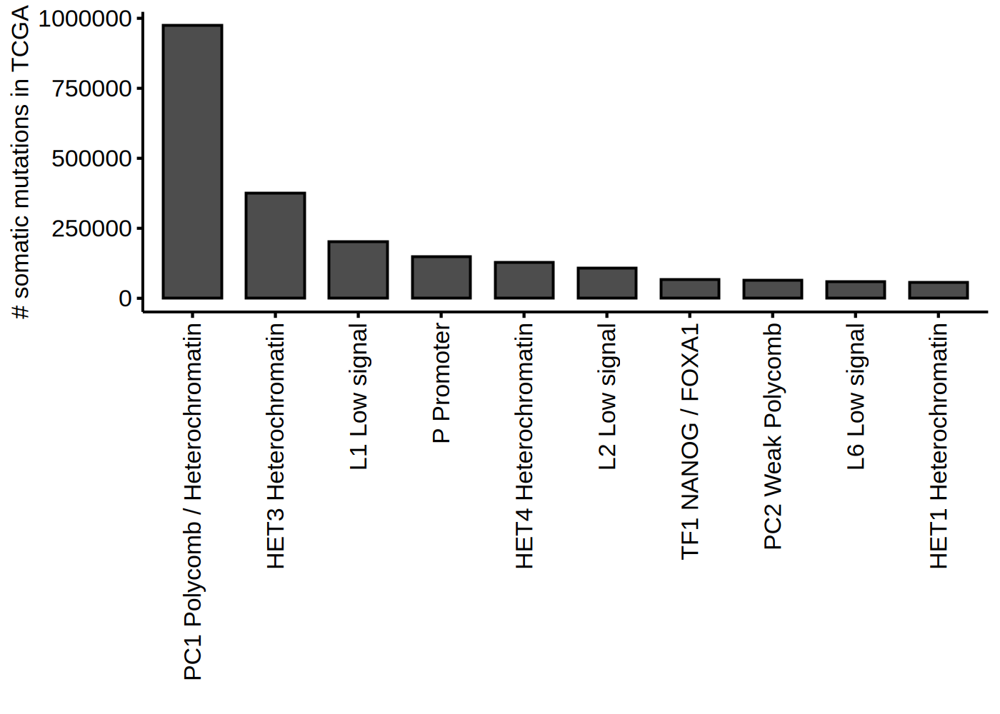

In [14]:
plotdat = copy(mc3_unique[,  .(tag, orig_seqclass_name, mutated_seqclass_name) ] )
plotdat = as.data.table(melt(table(plotdat$orig_seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:10, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


Warning message in melt.default(table(plotdat$mutated_seqclass_name)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(plotdat$mutated_seqclass_name)). In the next version, this warning will become an error."


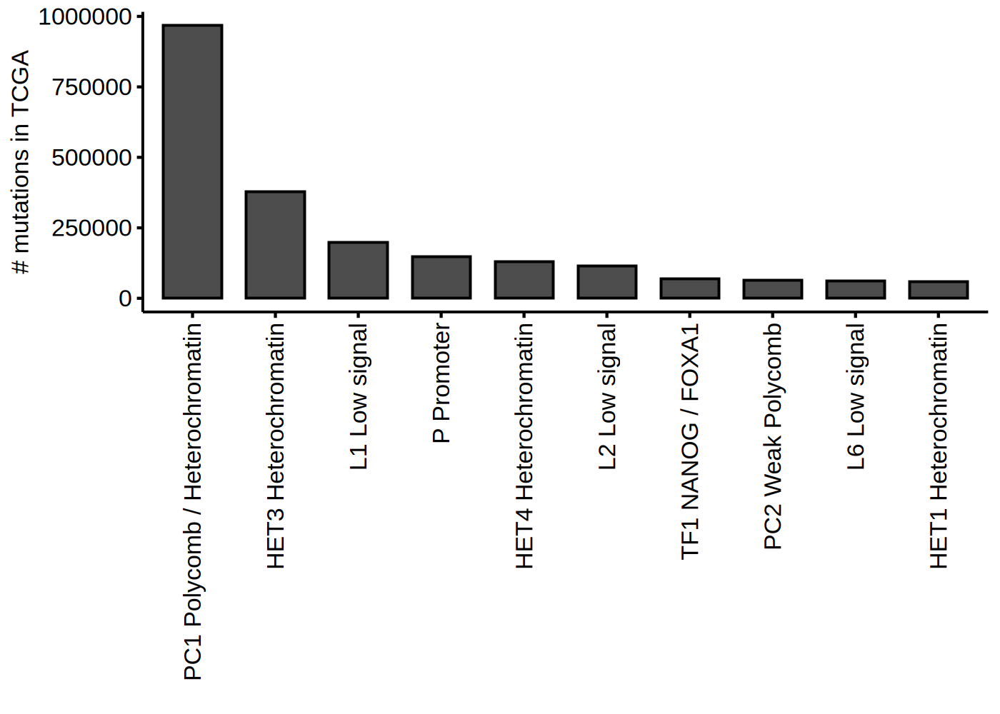

In [102]:
plotdat = copy(mc3_unique[,  .(tag, orig_seqclass_name, mutated_seqclass_name) ] )
plotdat = as.data.table(melt(table(plotdat$mutated_seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:10, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


In [15]:
table(mc3_unique$ONCOGENIC)
table(mc3_unique[orig_seqclass_name != mutated_seqclass_name, ONCOGENIC])


    Inconclusive   Likely Neutral Likely Oncogenic        Oncogenic       Resistance          Unknown 
             253              248            17610              587                7          3072748 


    Inconclusive   Likely Neutral Likely Oncogenic        Oncogenic       Resistance          Unknown 
              37               22             1575               41                2           219401 

In [234]:
dat = matrix(c(nrow(mc3_unique[ONCOGENIC %in% c('Likely Oncogenic', 'Oncogenic'), ]), 
               nrow(mc3_unique[ONCOGENIC %in% c('Inclusive', 'Likely Neutral', 'Resistance', 'Unknown'), ]), 
               nrow(mc3_unique[orig_seqclass_name != mutated_seqclass_name & ONCOGENIC %in% c('Likely Oncogenic', 'Oncogenic'), ]), 
               nrow(mc3_unique[orig_seqclass_name != mutated_seqclass_name & ONCOGENIC %in% c('Inclusive', 'Likely Neutral', 'Resistance', 'Unknown'), ])), nrow = 2)  
dat
chisq.test(dat)

18197,1723
3073003,242001



	Pearson's Chi-squared test with Yates' continuity correction

data:  dat
X-squared = 53.028, df = 1, p-value = 3.288e-13


Warning message in melt.default(table(plotdat$orig_seqclass_name)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(plotdat$orig_seqclass_name)). In the next version, this warning will become an error."


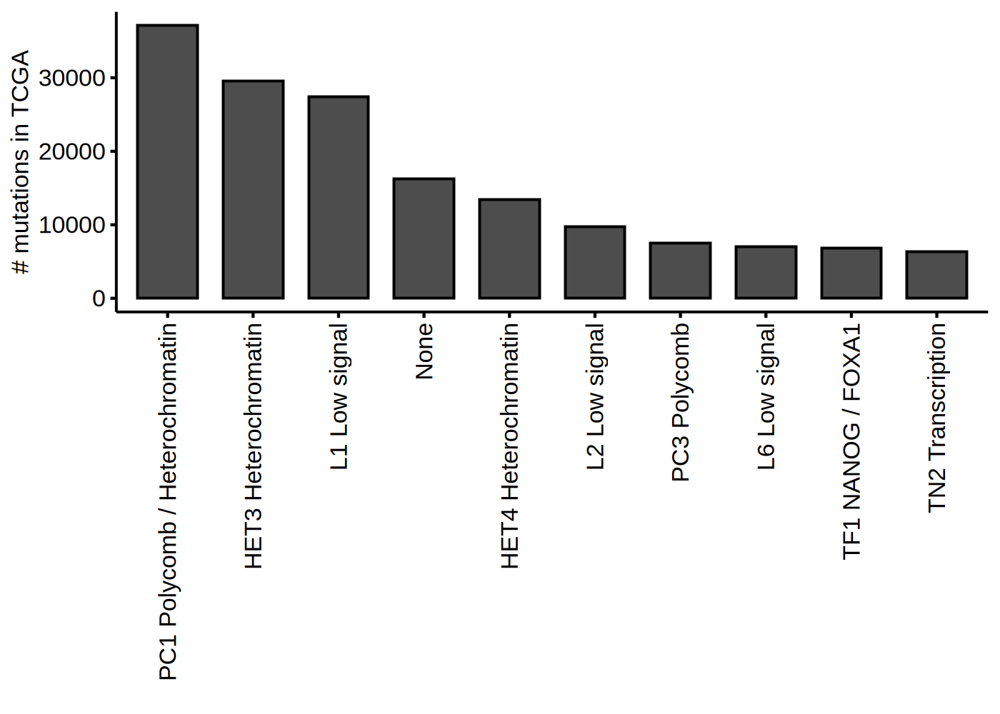

In [235]:
plotdat = copy(mc3_unique[orig_seqclass_name != mutated_seqclass_name,  .(tag, orig_seqclass_name, mutated_seqclass_name) ] )
plotdat = as.data.table(melt(table(plotdat$orig_seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:10, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


Warning message in melt.default(table(plotdat$mutated_seqclass_name)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(plotdat$mutated_seqclass_name)). In the next version, this warning will become an error."


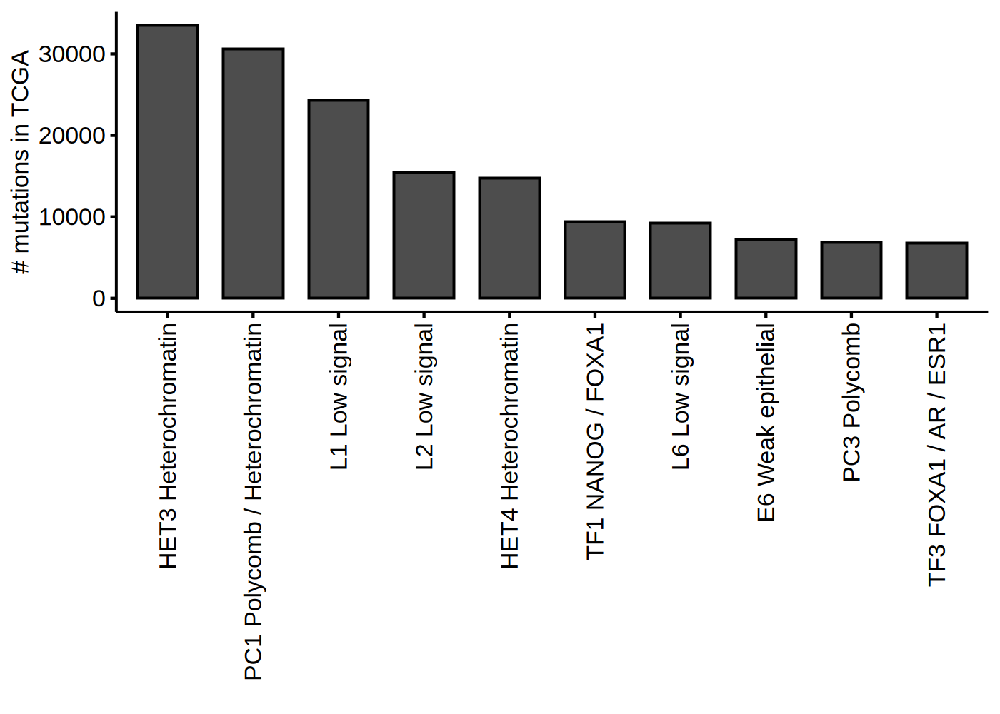

In [236]:
plotdat = copy(mc3_unique[orig_seqclass_name != mutated_seqclass_name,  .(tag, orig_seqclass_name, mutated_seqclass_name) ] )
plotdat = as.data.table(melt(table(plotdat$mutated_seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:10, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


Warning message in melt.default(table(plotdat$project_id)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(plotdat$project_id)). In the next version, this warning will become an error."


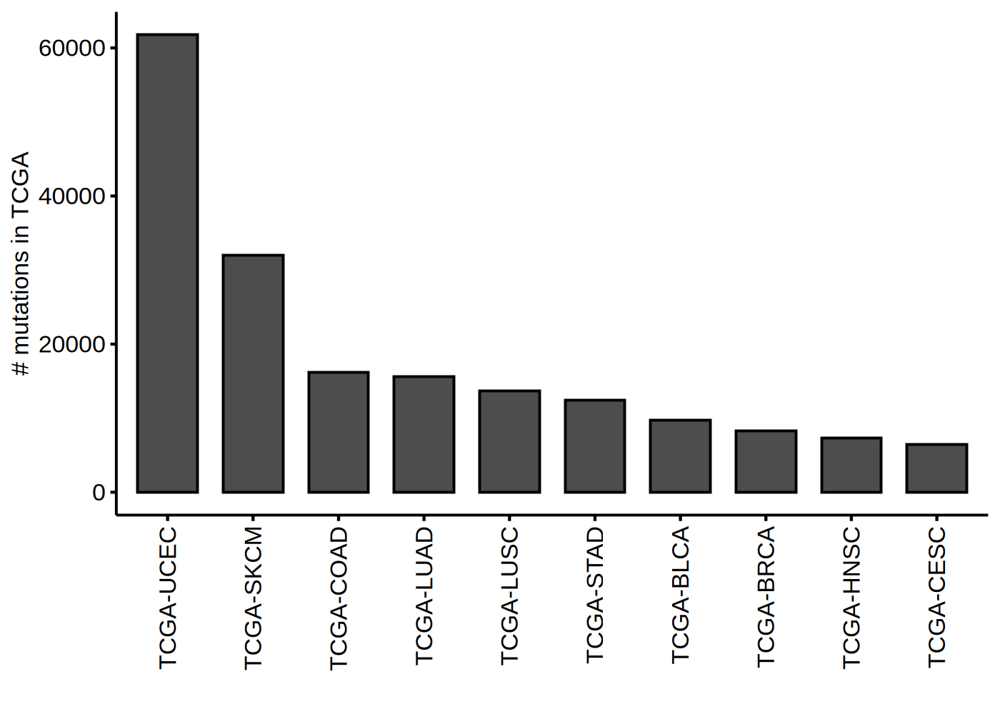

In [105]:
plotdat = copy(mc3_unique[orig_seqclass_name != mutated_seqclass_name,  .(tag, project_id, orig_seqclass_name, mutated_seqclass_name) ] )
plotdat = as.data.table(melt(table(plotdat$project_id)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:10, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


Warning message in melt.default(table(plotdat$project_id)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(plotdat$project_id)). In the next version, this warning will become an error."


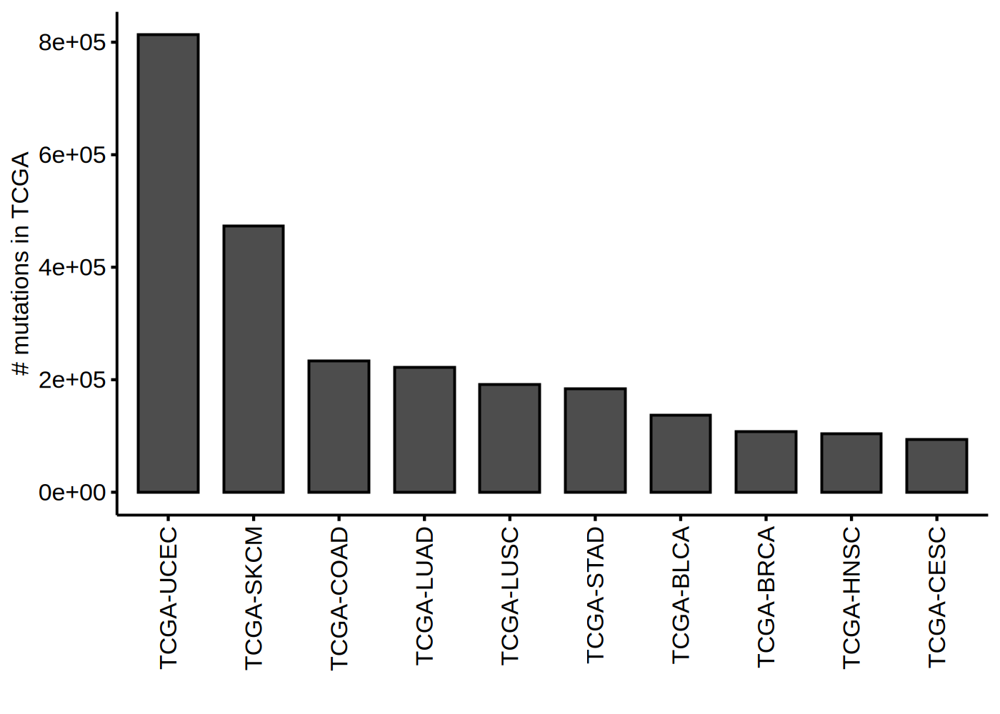

In [106]:
plotdat = copy(mc3_unique[,  .(tag, project_id, orig_seqclass_name, mutated_seqclass_name) ] )
plotdat = as.data.table(melt(table(plotdat$project_id)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:10, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


In [275]:
dim(mc3)
dim(mc3_unique)
length(table(mc3$project_id))

[1] 3600963     120

[1] 3091453     153

[1] 33

In [98]:
head(plotdat)

Var1,value
<fct>,<int>
TCGA-UCEC,61780
TCGA-SKCM,32037
TCGA-COAD,16179
TCGA-LUAD,15598
TCGA-LUSC,13667
TCGA-STAD,12392


In [140]:
plotdat = copy(mc3_unique[orig_seqclass_name != mutated_seqclass_name,  .(tag, orig_seqclass_name, mutated_seqclass_name) ] )
plotdat = as.data.table(melt(table(plotdat$orig_seqclass_name, plotdat$mutated_seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
head(plotdat)

Warning message in melt.default(table(plotdat$orig_seqclass_name, plotdat$mutated_seqclass_name)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(plotdat$orig_seqclass_name, plotdat$mutated_seqclass_name)). In the next version, this warning will become an error."


Var1,Var2,value
<fct>,<fct>,<int>
PC1 Polycomb / Heterochromatin,HET4 Heterochromatin,9907
L1 Low signal,L2 Low signal,6658
HET4 Heterochromatin,HET3 Heterochromatin,6551
HET3 Heterochromatin,L1 Low signal,6039
L1 Low signal,HET3 Heterochromatin,5438
PC1 Polycomb / Heterochromatin,HET3 Heterochromatin,5330


In [142]:
head(plotdat[grepl('TF|^E|P |CTCF', Var2), ])

Var1,Var2,value
<fct>,<fct>,<int>
L1 Low signal,TF1 NANOG / FOXA1,1981
L2 Low signal,TF1 NANOG / FOXA1,1825
TF3 FOXA1 / AR / ESR1,TF1 NANOG / FOXA1,1812
PC1 Polycomb / Heterochromatin,CTCF CTCF-Cohesin,1492
HET3 Heterochromatin,E6 Weak epithelial,1402
L2 Low signal,TF2 CEBPB,1345


In [207]:
dat = mc3_unique[orig_seqclass_name != mutated_seqclass_name & Hugo_Symbol == 'PIK3CA',
          .(tag, Hugo_Symbol, Variant_Classification, Variant_Type, project_id, orig_seqclass_name, mutated_seqclass_name, HGVSp_Short, ONCOGENIC)]
dim(dat)
head(dat)

[1] 78  9

tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
3_178936083_178936083_T,PIK3CA,Missense_Mutation,SNP,TCGA-GBM,L1 Low signal,TF1 NANOG / FOXA1,p.E542V,Oncogenic
3_178921393_178921393_T,PIK3CA,Missense_Mutation,SNP,TCGA-GBM,E3 Brain / Melanocyte,L2 Low signal,p.S292I,Unknown
3_178916851_178916853_-,PIK3CA,In_Frame_Del,DEL,TCGA-GBM,L1 Low signal,L2 Low signal,p.E81del,Unknown
3_178916882_178916882_A,PIK3CA,Missense_Mutation,SNP,TCGA-GBM,L2 Low signal,L1 Low signal,p.C90Y,Likely Neutral
3_178916890_178916890_T,PIK3CA,Missense_Mutation,SNP,TCGA-GBM,L1 Low signal,L2 Low signal,p.R93W,Likely Oncogenic
3_178928017_178928017_G,PIK3CA,Missense_Mutation,SNP,TCGA-CESC,TF1 NANOG / FOXA1,L1 Low signal,p.Y432C,Unknown


In [98]:
mc3_unique[, orig_active := F ]
mc3_unique[grepl('TF|^E|P |CTCF', orig_seqclass_name), orig_active := T ]
mc3_unique[, mutated_active := F ]
mc3_unique[grepl('TF|^E|P |CTCF', mutated_seqclass_name), mutated_active := T ]

In [250]:
plotdat = copy(mc3_unique[orig_seqclass_name != mutated_seqclass_name, ])
table(plotdat$orig_active, plotdat$mutated_active)


       
         FALSE   TRUE
  FALSE 130858  44328
  TRUE   36179  32397

In [282]:
dat = mc3_unique[orig_seqclass_name != mutated_seqclass_name & orig_active == F & mutated_active == T, cc, with = F]
datatable(dat)
dat_act = copy(dat)

Warning message in instance$preRenderHook(instance):
"It seems your data is too big for client-side DataTables. You may consider server-side processing: https://rstudio.github.io/DT/server.html"


HTML widgets cannot be represented in plain text (need html)

In [272]:
table(mc3_unique$Variant_Classification)


               3'Flank                  3'UTR                5'Flank                  5'UTR        Frame_Shift_Del        Frame_Shift_Ins           In_Frame_Del           In_Frame_Ins 
                 18456                 248648                  13743                  71762                  61844                  22436                   8889                    836 
                Intron      Missense_Mutation      Nonsense_Mutation       Nonstop_Mutation                    RNA                 Silent            Splice_Site Translation_Start_Site 
                 95862                1656451                 130512                   1858                  42525                 669393                  45785                   2453 

In [271]:
dat[Variant_Classification == 'Missense_Mutation',]

tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
5_31424569_31424569_G,DROSHA,Missense_Mutation,SNP,TCGA-GBM,L6 Low signal,E10 Brain,p.E1076Q,Unknown
1_21934791_21934791_G,RAP1GAP,Missense_Mutation,SNP,TCGA-OV,PC1 Polycomb / Heterochromatin,P Promoter,p.H468P,Unknown
5_141033679_141033679_T,ARAP3,Missense_Mutation,SNP,TCGA-OV,PC1 Polycomb / Heterochromatin,E2 Multi-tissue,p.S1491R,Unknown
21_22652946_22652946_C,NCAM2,Missense_Mutation,SNP,TCGA-OV,L1 Low signal,E7 Monocyte / Macrophage,p.G35A,Unknown
19_47423944_47423944_A,ARHGAP35,Missense_Mutation,SNP,TCGA-OV,HET3 Heterochromatin,E1 Stem cell,p.L671Q,Unknown
4_138452858_138452858_A,PCDH18,Missense_Mutation,SNP,TCGA-OV,PC3 Polycomb,E8 Weak multi-tissue,p.D129Y,Unknown
X_120183098_120183098_C,GLUD2,Missense_Mutation,SNP,TCGA-OV,HET3 Heterochromatin,TF5 AR,p.Q520H,Unknown
16_25264268_25264268_C,ZKSCAN2,Missense_Mutation,SNP,TCGA-OV,PC1 Polycomb / Heterochromatin,E7 Monocyte / Macrophage,p.Q226R,Unknown
17_67133497_67133497_T,ABCA6,Missense_Mutation,SNP,TCGA-OV,L2 Low signal,TF1 NANOG / FOXA1,p.P81T,Unknown


Warning message in melt.default(table(dat[Variant_Classification == "Missense_Mutation", :
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(dat[Variant_Classification == "Missense_Mutation", orig_seqclass_name])). In the next version, this warning will become an error."
Warning message:
"Removed 1 row containing missing values or values outside the scale range (`geom_bar()`)."


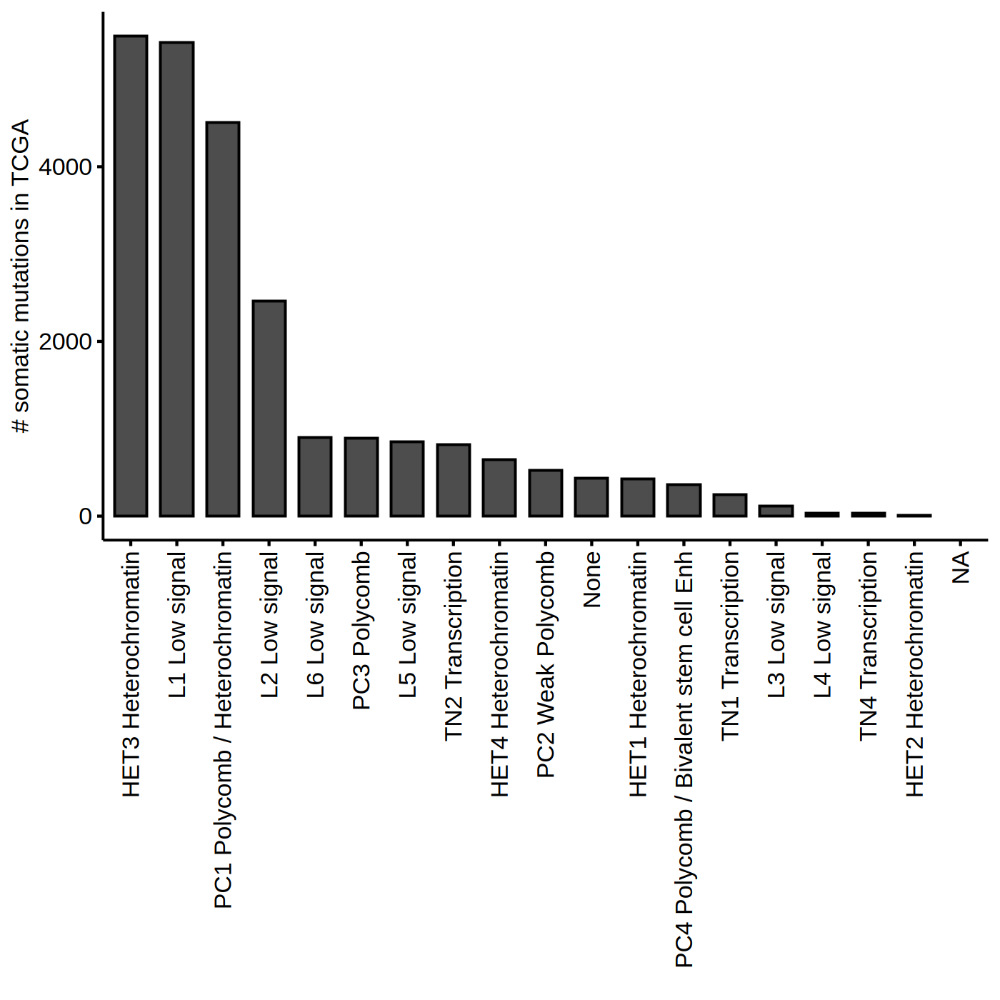

In [270]:
plotdat = as.data.table(melt(table(dat[Variant_Classification == 'Missense_Mutation', orig_seqclass_name])))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:19, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


Warning message in melt.default(table(dat$Variant_Classification)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(dat$Variant_Classification)). In the next version, this warning will become an error."
Warning message:
"Removed 3 rows containing missing values or values outside the scale range (`geom_bar()`)."


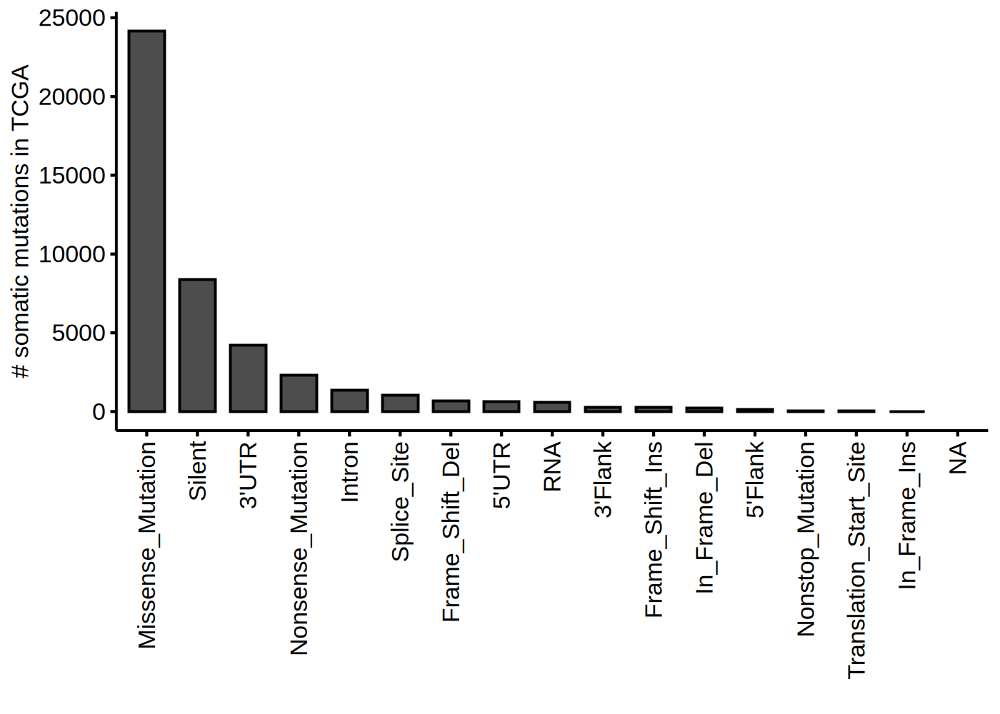

In [268]:
plotdat = as.data.table(melt(table(dat$Variant_Classification)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:19, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


Warning message in melt.default(table(dat$orig_seqclass_name)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(dat$orig_seqclass_name)). In the next version, this warning will become an error."


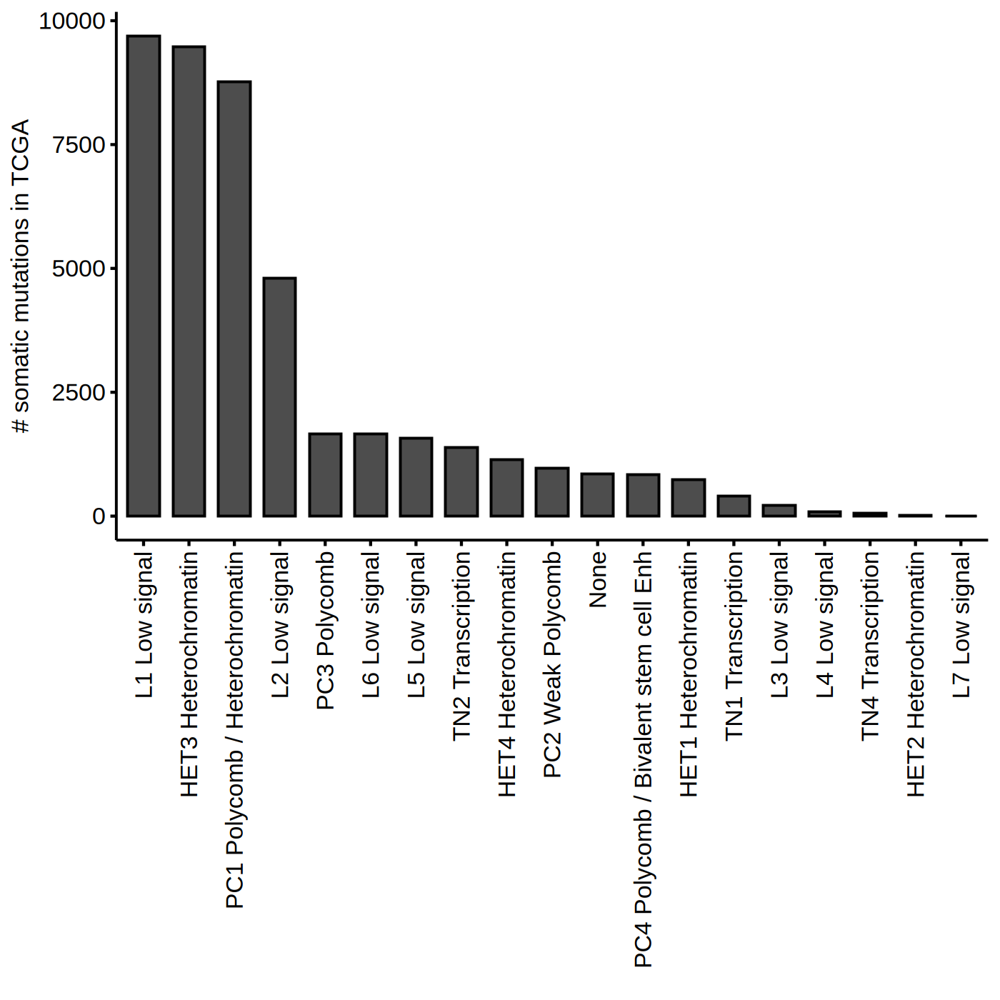

In [266]:
plotdat = as.data.table(melt(table(dat$orig_seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:19, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


Warning message in melt.default(table(dat$mutated_seqclass_name)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(dat$mutated_seqclass_name)). In the next version, this warning will become an error."


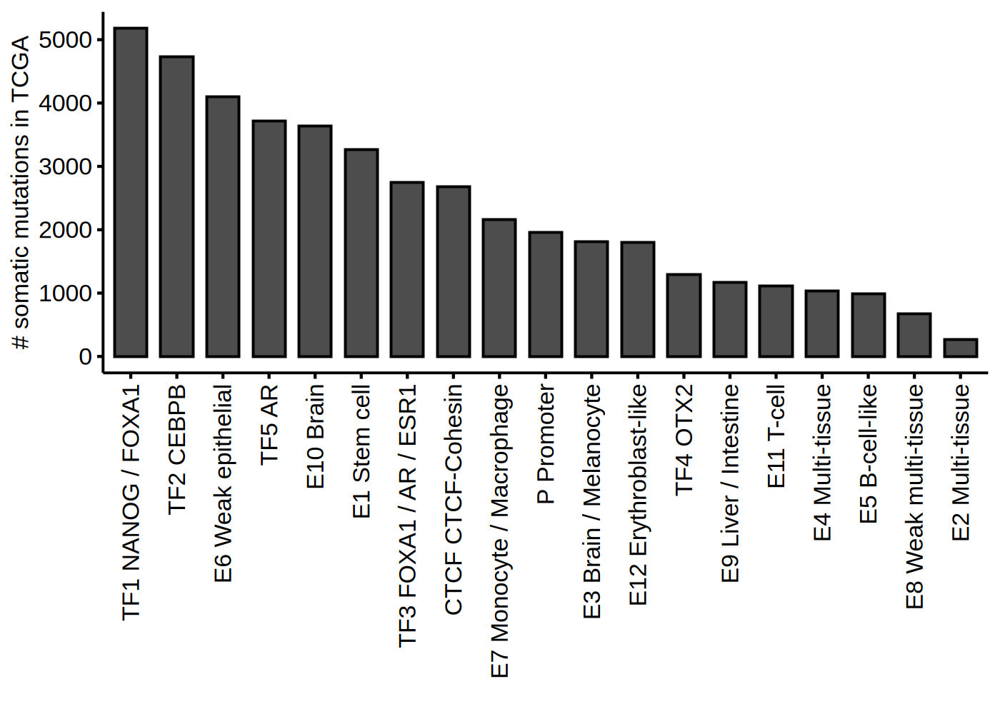

In [264]:
plotdat = as.data.table(melt(table(dat$mutated_seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:19, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


In [283]:
dat = mc3_unique[orig_seqclass_name != mutated_seqclass_name & orig_active == T & mutated_active == F, cc, with = F]
table(dat$mutated_seqclass_name)
datatable(dat)
dat_ina = copy(dat)


                 HET1 Heterochromatin                  HET2 Heterochromatin                  HET3 Heterochromatin                  HET4 Heterochromatin 
                                  552                                     6                                  7505                                   817 
                        L1 Low signal                         L2 Low signal                         L3 Low signal                         L4 Low signal 
                                 7763                                  4364                                   194                                    76 
                        L5 Low signal                         L6 Low signal                                  None        PC1 Polycomb / Heterochromatin 
                                 1655                                  1582                                   870                                  6474 
                    PC2 Weak Polycomb                          PC3 Polycomb PC4 P

Warning message in instance$preRenderHook(instance):
"It seems your data is too big for client-side DataTables. You may consider server-side processing: https://rstudio.github.io/DT/server.html"


HTML widgets cannot be represented in plain text (need html)

Warning message in melt.default(table(dat$orig_seqclass_name)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(dat$orig_seqclass_name)). In the next version, this warning will become an error."


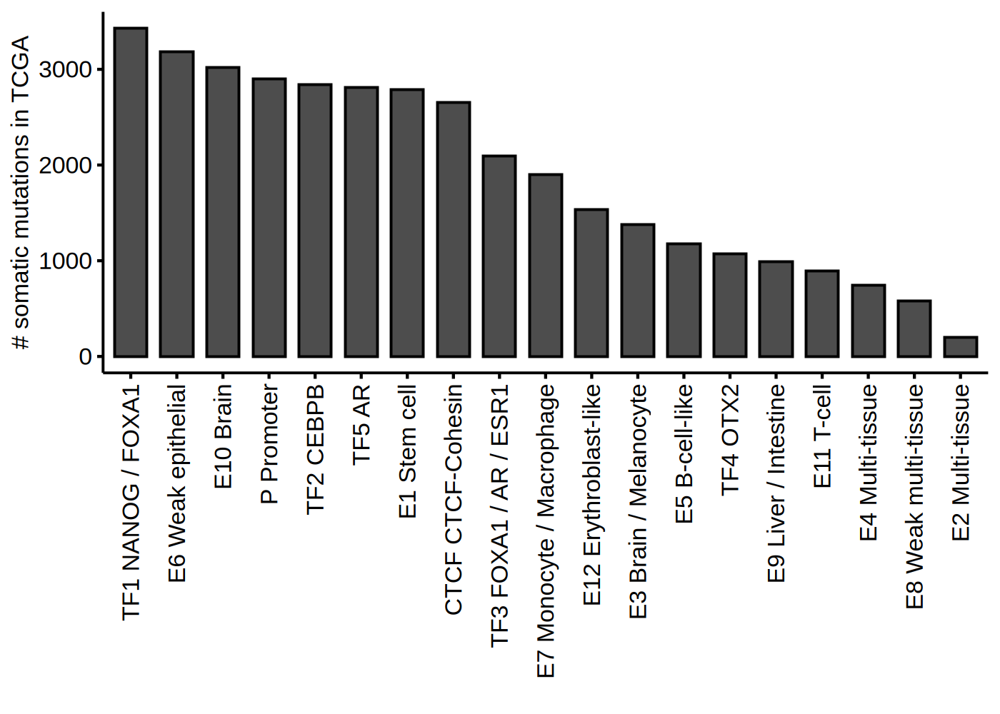

In [279]:
plotdat = as.data.table(melt(table(dat$orig_seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:19, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


Warning message in melt.default(table(dat$mutated_seqclass_name)):
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(dat$mutated_seqclass_name)). In the next version, this warning will become an error."
Warning message:
"Removed 1 row containing missing values or values outside the scale range (`geom_bar()`)."


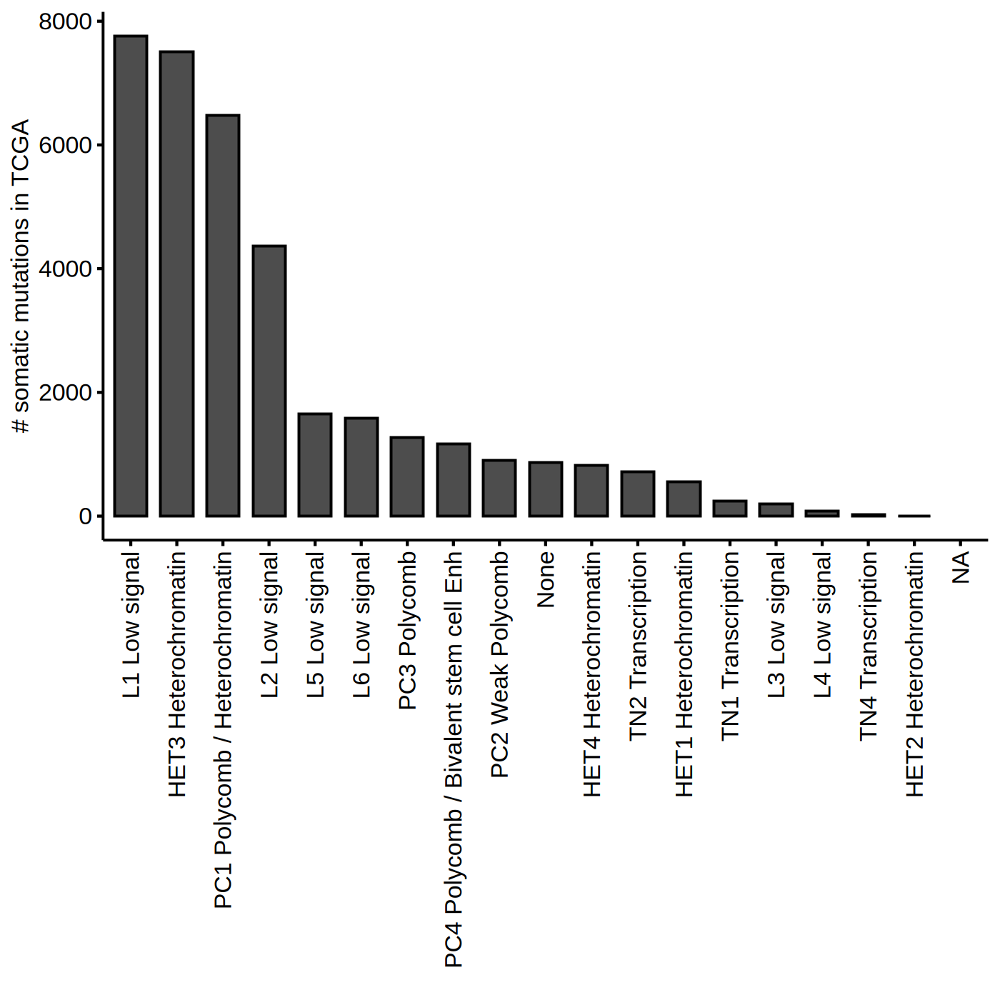

In [281]:
plotdat = as.data.table(melt(table(dat$mutated_seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 7, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:19, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab(ylab) + xlab('')
gg1


In [293]:
dat_ina[ONCOGENIC %in% c('Unknown'), ]
#dat_ina[ONCOGENIC %in% c('Likely Oncogenic'), ]
#dat_ina[ONCOGENIC %in% c('Oncogenic'), ]

tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2_227662172_227662172_A,IRS1,Missense_Mutation,SNP,TCGA-GBM,P Promoter,None,p.S428L,Unknown
3_111887770_111887770_T,SLC9C1,Missense_Mutation,SNP,TCGA-GBM,TF2 CEBPB,L2 Low signal,p.R1064Q,Unknown
15_40512942_40512942_A,BUB1B,Silent,SNP,TCGA-GBM,E1 Stem cell,HET3 Heterochromatin,p.G1045G,Unknown
1_172108006_172108006_A,DNM3,Intron,SNP,TCGA-GBM,E6 Weak epithelial,PC2 Weak Polycomb,.,Unknown
7_107790294_107790297_-,NRCAM,3'UTR,DEL,TCGA-GBM,TF1 NANOG / FOXA1,L1 Low signal,.,Unknown
11_26569054_26569054_A,ANO3,Missense_Mutation,SNP,TCGA-GBM,TF1 NANOG / FOXA1,L2 Low signal,p.V416I,Unknown
16_14704541_14704541_C,PARN,Missense_Mutation,SNP,TCGA-GBM,E10 Brain,L1 Low signal,p.T172A,Unknown
7_100884131_100884131_T,FIS1,Missense_Mutation,SNP,TCGA-GBM,E12 Erythroblast-like,PC1 Polycomb / Heterochromatin,p.V79M,Unknown
10_73473065_73473065_A,C10orf105,3'UTR,SNP,TCGA-OV,P Promoter,PC1 Polycomb / Heterochromatin,.,Unknown


In [285]:
table(dat_act$ONCOGENIC)
table(dat_ina$ONCOGENIC)



    Inconclusive   Likely Neutral Likely Oncogenic        Oncogenic       Resistance          Unknown 
               8                6              308                9                2            43995 


    Inconclusive   Likely Neutral Likely Oncogenic        Oncogenic          Unknown 
              10                4              252                5            35908 

In [249]:
dat = mc3_unique[mutated_seqclass_name != mutated_seqclass_name & orig_active == T & mutated_active == F, 
          .(tag, Hugo_Symbol, Variant_Classification, Variant_Type, project_id, orig_seqclass_name, mutated_seqclass_name, HGVSp_Short, ONCOGENIC)]
table(dat$mutated_seqclass_name)
datatable(dat)

< table of extent 0 >

HTML widgets cannot be represented in plain text (need html)

In [217]:
tag1 = '1_21934791_21934791_G'
mc3_unique[tag == tag1, .(Reference_Allele, Tumor_Seq_Allele1, Tumor_Seq_Allele2, ONCOGENIC)]
tmp1[which(mc3_unique$tag == tag1), ]
which.max(tmp1[which(mc3_unique$tag == tag1), ])
tmp2[which(mc3_unique$tag == tag1), ]
which.max(tmp2[which(mc3_unique$tag == tag1), ])
tmp2[which(mc3_unique$tag == tag1), which.max(tmp2[which(mc3_unique$tag == tag1), ]), with = F ]

Reference_Allele,Tumor_Seq_Allele1,Tumor_Seq_Allele2,ONCOGENIC
<chr>,<chr>,<chr>,<chr>
T,T,G,Unknown


V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
7.813053,2.706041,1.064824,1.334233,1.55481,3.513527,2.801409,2.540065,4.60944,3.408443,⋯,0.078385,1.159676,4.877211,5.859939,2.219816,2.169403,3.852043,1.712525,3.542345,3.062882


V1 
 1

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
8.375321,2.987778,1.196033,1.49465,1.715783,4.181055,3.298823,3.000557,4.89592,4.215414,⋯,0.09834,1.239617,5.029426,6.187867,2.455612,2.257735,3.987068,1.85209,3.76051,3.244762


V26 
 26

V26
<dbl>
8.797324


In [197]:
mc3_unique[Hugo_Symbol == 'DNMT3A' & orig_seqclass_name != mutated_seqclass_name, 
          .(tag, Hugo_Symbol, Variant_Classification, Variant_Type, project_id, orig_seqclass_name, mutated_seqclass_name, HGVSp_Short, ONCOGENIC)]

tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
2_25462066_25462066_G,DNMT3A,Missense_Mutation,SNP,TCGA-LUAD,PC1 Polycomb / Heterochromatin,E4 Multi-tissue,p.D781H,Likely Oncogenic
2_25457180_25457180_T,DNMT3A,Missense_Mutation,SNP,TCGA-UCEC,PC1 Polycomb / Heterochromatin,PC2 Weak Polycomb,p.A903T,Unknown
2_25498412_25498412_A,DNMT3A,Missense_Mutation,SNP,TCGA-HNSC,E7 Monocyte / Macrophage,L5 Low signal,p.G150V,Unknown
2_25457184_25457184_A,DNMT3A,Silent,SNP,TCGA-BLCA,PC1 Polycomb / Heterochromatin,PC2 Weak Polycomb,p.L901L,Unknown
2_25458692_25458692_A,DNMT3A,Silent,SNP,TCGA-BLCA,PC1 Polycomb / Heterochromatin,L4 Low signal,p.F827F,Unknown
2_25463271_25463271_A,DNMT3A,Missense_Mutation,SNP,TCGA-PRAD,PC1 Polycomb / Heterochromatin,HET4 Heterochromatin,p.A741V,Likely Oncogenic
2_25463207_25463207_A,DNMT3A,Silent,SNP,TCGA-UCEC,PC1 Polycomb / Heterochromatin,HET4 Heterochromatin,p.G762G,Unknown


In [204]:
#mc3_unique[orig_seqclass_name != mutated_seqclass_name & mutated_seqclass_name == 'TF1 NANOG / FOXA1', 
#          .(tag, Hugo_Symbol, Variant_Classification, Variant_Type, project_id, HGVSp_Short, orig_seqclass_name, mutated_seqclass_name)]
dat = mc3_unique[Variant_Type == 'INS' & project_id == 'TCGA-LAML' & orig_seqclass_name != mutated_seqclass_name, 
          .(tag, Hugo_Symbol, Variant_Classification, Variant_Type, project_id, HGVSp_Short, orig_seqclass_name, mutated_seqclass_name, ONCOGENIC, Start_Position, End_Position, Reference_Allele, Tumor_Seq_Allele2 )]
dat[2, Reference_Allele] 
dat[2, Tumor_Seq_Allele2] 


[1] "-"

[1] "C"

In [201]:
#mc3_unique[orig_seqclass_name != mutated_seqclass_name & mutated_seqclass_name == 'TF1 NANOG / FOXA1', 
#          .(tag, Hugo_Symbol, Variant_Classification, Variant_Type, project_id, HGVSp_Short, orig_seqclass_name, mutated_seqclass_name)]
datatable(mc3_unique[project_id == 'TCGA-LAML' & orig_seqclass_name != mutated_seqclass_name, 
          .(tag, Hugo_Symbol, Variant_Classification, Variant_Type, project_id, HGVSp_Short, orig_seqclass_name, mutated_seqclass_name, ONCOGENIC, Start_Position, End_Position, Reference_Allele, Tumor_Seq_Allele2 )])


HTML widgets cannot be represented in plain text (need html)

In [136]:
mc3_unique[orig_seqclass_name != mutated_seqclass_name & orig_seqclass_name %in% c('L1 Low signal', 'L2 Low signal') & mutated_seqclass_name == 'TF1 NANOG / FOXA1', 
          .(tag, Hugo_Symbol, Variant_Classification, Variant_Type, project_id, HGVSp_Short, orig_seqclass_name, mutated_seqclass_name)]

tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,HGVSp_Short,orig_seqclass_name,mutated_seqclass_name
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
17_67133497_67133497_T,ABCA6,Missense_Mutation,SNP,TCGA-OV,p.P81T,L2 Low signal,TF1 NANOG / FOXA1
4_25128959_25128959_T,SEPSECS,Silent,SNP,TCGA-OV,p.S349S,L1 Low signal,TF1 NANOG / FOXA1
10_68381522_68381522_A,CTNNA3,Silent,SNP,TCGA-OV,p.S434S,L1 Low signal,TF1 NANOG / FOXA1
14_45374763_45374763_C,C14orf28,3'UTR,SNP,TCGA-LUAD,.,L2 Low signal,TF1 NANOG / FOXA1
4_110687980_110687980_G,CFI,Missense_Mutation,SNP,TCGA-LUAD,p.V20L,L1 Low signal,TF1 NANOG / FOXA1
6_116289825_116289827_-,FRK,In_Frame_Del,DEL,TCGA-LUAD,p.R181del,L1 Low signal,TF1 NANOG / FOXA1
5_79454738_79454738_A,SERINC5,Missense_Mutation,SNP,TCGA-LUAD,p.G303C,L1 Low signal,TF1 NANOG / FOXA1
X_100417903_100417903_T,CENPI,Missense_Mutation,SNP,TCGA-LUAD,p.H740Y,L2 Low signal,TF1 NANOG / FOXA1
10_32307277_32307277_C,KIF5B,Silent,SNP,TCGA-LUAD,p.L802L,L1 Low signal,TF1 NANOG / FOXA1


In [ ]:
plotdat[Var2 == 'TF1 NANOG / FOXA1', ]

In [109]:
print(plotdat[10:20])

                              Var1                 Var2 value
                            <fctr>               <fctr> <int>
 1:           HET3 Heterochromatin        L6 Low signal  2847
 2:                  L2 Low signal        L1 Low signal  2724
 3: PC1 Polycomb / Heterochromatin        L4 Low signal  2397
 4: PC1 Polycomb / Heterochromatin    PC2 Weak Polycomb  2341
 5:                   PC3 Polycomb HET3 Heterochromatin  2208
 6: PC1 Polycomb / Heterochromatin         PC3 Polycomb  2158
 7:           HET3 Heterochromatin HET4 Heterochromatin  2043
 8:                  L1 Low signal    TF1 NANOG / FOXA1  1981
 9:                  L6 Low signal HET3 Heterochromatin  1892
10:                  L1 Low signal    TN2 Transcription  1826
11:                  L2 Low signal    TF1 NANOG / FOXA1  1825


In [ ]:
plotdat = copy(mc3_unique[orig_seqclass_name != mutated_seqclass_name,  .(tag, orig_seqclass_name, mutated_seqclass_name) ] )
plotdat = as.data.table(melt(table(plotdat$orig_seqclass_name, plotdat$mutated_seqclass_name)))
plotdat = plotdat[order(value, decreasing = T), ]
plotdat[, Var1 := factor(Var1, levels = plotdat$Var1) ]
options(repr.plot.width = 7, repr.plot.height = 5, repr.plot.res = 200)
gg1 = ggbarplot(plotdat[1:10, ], x = 'Var1', y = 'value', fill = 'grey30') + rotate_x_text(90) + ylab('# CpG loci') + xlab('')
gg1


In [106]:
saveRDS(mc3_unique, file = 'mc3_unique_oncokb_sei.rds')


In [ ]:
#saveRDS(mc3_unique, file = 'mc3_unique_oncokb_sei.rds')
mc3_unique = readRDS(file = 'mc3_unique_oncokb_sei.rds')

# download TCGA RNA-Seq data


In [295]:
install.packages("UCSCXenaTools")

In [296]:
library(UCSCXenaTools)


UCSCXenaTools version 1.4.8
Project URL: https://github.com/ropensci/UCSCXenaTools
Usages: https://cran.r-project.org/web/packages/UCSCXenaTools/vignettes/USCSXenaTools.html

If you use it in published research, please cite:
Wang et al., (2019). The UCSCXenaTools R package: a toolkit for accessing genomics data
  from UCSC Xena platform, from cancer multi-omics to single-cell RNA-seq.
  Journal of Open Source Software, 4(40), 1627, https://doi.org/10.21105/joss.01627
                              --Enjoy it--


Attaching package: 'UCSCXenaTools'


The following object is masked from 'package:RSQLite':

    fetch


The following object is masked from 'package:Biobase':

    samples




In [300]:
data(XenaData)
dim(XenaData)
head(XenaData)


[1] 1681   17

XenaHosts,XenaHostNames,XenaCohorts,XenaDatasets,SampleCount,DataSubtype,Label,Type,AnatomicalOrigin,SampleType,Tags,ProbeMap,LongTitle,Citation,Version,Unit,Platform
<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
https://ucscpublic.xenahubs.net,publicHub,Breast Cancer Cell Lines (Neve 2006),ucsfNeve_public/ucsfNeveExp_genomicMatrix,51,gene expression,Neve Cell Line gene expression,genomicMatrix,Breast,cell line,"cell lines,breast cancer",probeMap/affyU133_ucscGenomeBrowser_hg18.probeMap,Cell Line Gene Expression (Neve et al. Cancer Cell 2006),Cancer Cell. 2006 Dec;10(6):515-27.,2011-11-01,NA,NA
https://ucscpublic.xenahubs.net,publicHub,Breast Cancer Cell Lines (Neve 2006),ucsfNeve_public/ucsfNeve_public_clinicalMatrix,57,phenotype,Phenotypes,clinicalMatrix,,,cancer,NA,NA,NA,2011-11-11,NA,NA
https://ucscpublic.xenahubs.net,publicHub,Glioma (Kotliarov 2006),kotliarov2006_public/kotliarov2006_genomicMatrix,194,copy number,Kotliarov Glioma CGH,genomicMatrix,Brain,tumor,"cancer,neural",probeMap/probesAffy100K,Glioma CGH (Kotliarov et al. 2006),Cancer Res. 2006 Oct 1;66(19):9428-36.,2011-11-01,NA,NA
https://ucscpublic.xenahubs.net,publicHub,Glioma (Kotliarov 2006),kotliarov2006_public/kotliarov2006_public_clinicalMatrix,194,phenotype,Phenotypes,clinicalMatrix,,,cancer,NA,NA,NA,2011-11-11,NA,NA
https://ucscpublic.xenahubs.net,publicHub,Lung Cancer CGH (Weir 2007),weir2007_public/weir2007_genomicMatrix,383,copy number,CGH,genomicMatrix,Lung,tumor,cancer,probeMap/probeAffy500K,Lung CGH (Weir et al. 2007),Nature. 2007 Dec 6;450(7171):893-8. Epub 2007 Nov 4.,2011-11-01,NA,NA
https://ucscpublic.xenahubs.net,publicHub,Lung Cancer CGH (Weir 2007),weir2007_public/weir2007_public_clinicalMatrix,383,phenotype,Phenotypes,clinicalMatrix,,,cancer,NA,NA,NA,2011-11-11,NA,NA


In [302]:
XenaData[grep('Tcga', XenaData$XenaDatasets), ]

XenaHosts,XenaHostNames,XenaCohorts,XenaDatasets,SampleCount,DataSubtype,Label,Type,AnatomicalOrigin,SampleType,Tags,ProbeMap,LongTitle,Citation,Version,Unit,Platform
<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
https://toil.xenahubs.net,toilHub,TCGA TARGET GTEx,TcgaTargetGtex_expected_count,19109,transcript expression RNAseq,RSEM expected_count,genomicMatrix,,,,probeMap/gencode.v23.annotation.transcript.probemap,NA,NA,2016-09-02,log2(expected_count+1),NA
https://toil.xenahubs.net,toilHub,TCGA TARGET GTEx,TcgaTargetGtex_gene_expected_count,19109,gene expression RNAseq,RSEM expected_count,genomicMatrix,,,,probeMap/gencode.v23.annotation.gene.probemap,NA,NA,2016-09-03,log2(expected_count+1),NA
https://toil.xenahubs.net,toilHub,TCGA TARGET GTEx,TcgaTargetGTEX_phenotype.txt,19131,phenotype,TCGA TARGET GTEX selected phenotypes,clinicalMatrix,,,,NA,NA,NA,2016-09-15,NA,NA
https://toil.xenahubs.net,toilHub,TCGA TARGET GTEx,TcgaTargetGtex_rsem_gene_fpkm,19131,gene expression RNAseq,RSEM fpkm,genomicMatrix,,,,probeMap/gencode.v23.annotation.gene.probemap,NA,NA,2016-09-03,log2(fpkm+0.001),NA
https://toil.xenahubs.net,toilHub,TCGA TARGET GTEx,TcgaTargetGtex_rsem_gene_tpm,19131,gene expression RNAseq,RSEM tpm,genomicMatrix,,,,probeMap/gencode.v23.annotation.gene.probemap,NA,NA,2016-09-03,log2(tpm+0.001),NA
https://toil.xenahubs.net,toilHub,TCGA TARGET GTEx,TcgaTargetGtex_RSEM_Hugo_norm_count,19120,gene expression RNAseq,RSEM norm_count,genomicMatrix,,,,probeMap/hugo_gencode_good_hg38_v23comp_probemap,NA,NA,2016-04-12,log2(norm_count+1),ILLUMINA
https://toil.xenahubs.net,toilHub,TCGA TARGET GTEx,TcgaTargetGtex_RSEM_isoform_fpkm,19129,transcript expression RNAseq,RSEM fpkm,genomicMatrix,,,,probeMap/gencode.v23.annotation.transcript.probemap,NA,NA,2016-09-02,log2(fpkm+0.001),NA
https://toil.xenahubs.net,toilHub,TCGA TARGET GTEx,TcgaTargetGtex_rsem_isoform_tpm,19131,transcript expression RNAseq,RSEM tpm,genomicMatrix,,,,probeMap/gencode.v23.annotation.transcript.probemap,NA,NA,2016-09-02,log2(tpm+0.001),NA
https://toil.xenahubs.net,toilHub,TCGA TARGET GTEx,TcgaTargetGtex_rsem_isopct,19131,transcript expression RNAseq,RSEM isoform percentage,genomicMatrix,,,,probeMap/gencode.v23.annotation.transcript.probemap,NA,NA,2016-09-02,IsoPct,NA


In [304]:
xe = XenaGenerate(subset = XenaDatasets == "TcgaTargetGtex_expected_count")
xe = XenaGenerate(subset = XenaDatasets == "TcgaTargetGtex_gene_expected_count")
xq = XenaQuery(xe)
# You cannot resume from breakpoint in default mode
#XenaDownload(xq, destdir = "~/WenhuoHu/", force = TRUE)
XenaDownload(xq, destdir = "~/WenhuoHu/", method = "wget", extra = "-c", force = TRUE)


This will check url status, please be patient.

All downloaded files will under directory ~/WenhuoHu/.

The 'trans_slash' option is FALSE, keep same directory structure as Xena.

Creating directories for datasets...




In [17]:
mtx = fread('~/WenhuoHu/TcgaTargetGtex_gene_expected_count')

In [18]:
mtx[, ensg := sub('\\..*', '', sample)]
tail(mtx)

sample,GTEX-S4Q7-0003-SM-3NM8M,TCGA-19-1787-01,TCGA-S9-A7J2-01,GTEX-QV31-1626-SM-2S1QC,TCGA-G3-A3CH-11,TCGA-B5-A5OE-01,GTEX-13QIC-0011-R1a-SM-5O9CJ,TCGA-B2-5641-11,GTEX-ZPCL-0126-SM-4WWC8,⋯,TCGA-FI-A2EY-01,TCGA-55-6985-11,TCGA-EJ-5527-01,TCGA-G3-A25X-01,GTEX-11ZTS-3326-SM-5LU9Y,GTEX-VJYA-0726-SM-4KL1T,GTEX-ZA64-2126-SM-5Q5A8,GTEX-Q2AG-2826-SM-2HMJQ,GTEX-XV7Q-0426-SM-4BRVN,ensg
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000267117.1,1.5850,1.0000,0.0000,0.0000,1.0000,0.0000,2.3219,1.0000,0.0000,⋯,2.0000,1.0000,1.0000,1.0000,0.0000,1.585,0.0000,1.0000,2.5850,ENSG00000267117
ENSG00000273233.1,1.0000,2.3219,2.3219,0.0000,0.0000,2.0000,1.5850,0.0000,1.5850,⋯,2.8074,0.0000,1.0000,1.0000,0.0000,0.000,0.0000,1.5850,1.0000,ENSG00000273233
ENSG00000105063.18,12.7739,12.2567,11.7780,9.9513,11.0046,12.3935,11.5112,12.0023,11.7578,⋯,12.3459,12.2006,12.1075,11.5054,11.2443,11.230,10.5854,10.6215,11.9701,ENSG00000105063
ENSG00000231119.2,2.5850,5.7279,2.8074,0.0000,3.9069,7.4594,4.3219,4.6439,4.5850,⋯,8.1997,6.4594,4.9069,5.7004,4.0875,1.000,4.4594,2.3219,3.0000,ENSG00000231119
ENSG00000280861.1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,⋯,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,ENSG00000280861
ENSG00000181518.3,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,⋯,0.0000,0.0000,0.0000,0.0000,0.0000,0.000,1.0000,0.0000,0.0000,ENSG00000181518


In [312]:
head2(mtx)

sample,GTEX-S4Q7-0003-SM-3NM8M,TCGA-19-1787-01,TCGA-S9-A7J2-01,GTEX-QV31-1626-SM-2S1QC
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000242268.2,1.585,0,4.6439,0
ENSG00000259041.1,0.000,0,0.0000,0
ENSG00000270112.3,2.585,2,2.8074,1


In [19]:
geneid = fread('~/repos/pipeline/gene_id.txt')

In [20]:
geneid[, ensg := sub('_.*', '', rn) ]
geneid = geneid[!duplicated(symbol), ]
setkey(geneid, 'ensg')
head(geneid)


.id,rn,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbol,ensg
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
res.c3.c1,ENSG00000000003_TSPAN6,4218.349176,-0.5597052,0.1947081,-2.874586,4.045572e-03,1.415923e-02,TSPAN6,ENSG00000000003
res.c2.c1,ENSG00000000005_TNMD,1.770194,3.1386118,0.8659886,3.624311,2.897331e-04,1.934407e-03,TNMD,ENSG00000000005
res.c2.c3,ENSG00000000419_DPM1,1138.227460,1.0980614,0.1184685,9.268803,1.882470e-20,5.524640e-18,DPM1,ENSG00000000419
res.c2.c1,ENSG00000000457_SCYL3,945.605741,-0.2574616,0.1303715,-1.974829,4.828752e-02,1.178057e-01,SCYL3,ENSG00000000457
res.c2.c3,ENSG00000000460_C1orf112,566.955616,0.7123381,0.1593714,4.469674,7.833886e-06,6.923266e-05,C1ORF112,ENSG00000000460
res.c3.c1,ENSG00000000938_FGR,444.320095,0.9611018,0.2775966,3.462224,5.357304e-04,2.605276e-03,FGR,ENSG00000000938


In [21]:
mtx$symbol = geneid[mtx$ensg, symbol]

In [22]:
head(mtx[, .(sample, symbol, ensg)])

sample,symbol,ensg
<chr>,<chr>,<chr>
ENSG00000242268.2,LINC02082,ENSG00000242268
ENSG00000259041.1,NA,ENSG00000259041
ENSG00000270112.3,RP11-742D12.2,ENSG00000270112
ENSG00000167578.16,RAB4B,ENSG00000167578
ENSG00000278814.1,NA,ENSG00000278814
ENSG00000078237.5,TIGAR,ENSG00000078237


In [23]:
mtx2 = mtx[!is.na(symbol), ]

In [236]:
dim(mtx2)
head2(mtx2)

[1] 46049
[2] 19112

sample,GTEX-S4Q7-0003-SM-3NM8M,TCGA-19-1787-01,TCGA-S9-A7J2-01,GTEX-QV31-1626-SM-2S1QC
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000242268.2,1.5850,0.0000,4.6439,0.0000
ENSG00000270112.3,2.5850,2.0000,2.8074,1.0000
ENSG00000167578.16,9.9364,10.3835,9.9144,7.8458


In [24]:
mtx3 = mtx2[, grep('TCGA', colnames(mtx2)), with = F ]

In [25]:
setDF(mtx3, rownames = mtx2$symbol)

In [26]:
mtx3 = t(mtx3)

In [27]:
dim(mtx3)
head2(mtx3)

[1] 10530 46049

,LINC02082,RP11-742D12.2,RAB4B,TIGAR,LINC01224
TCGA-19-1787-01,0.0000,2.0000,10.3835,9.7764,7.1898
TCGA-S9-A7J2-01,4.6439,2.8074,9.9144,8.7649,5.0875
TCGA-G3-A3CH-11,0.0000,0.0000,8.9539,6.8948,0.0000


In [238]:
tmp = mtx3[rownames(mtx3) %in% substr(mc3$Tumor_Sample_Barcode, 1, 15), colnames(mtx3) %in% c(dat_ina$Hugo_Symbol, dat_act$Hugo_Symbol)]
dim(tmp)
head2(tmp)

[1]  9171
[2] 11899

,RNF44,DNAH3,RPL23A,ARL8B,DACH1
TCGA-19-1787-01,11.1624,3.0000,14.1243,12.2521,5.3923
TCGA-S9-A7J2-01,11.9333,0.0000,13.7616,12.4564,8.5430
TCGA-B5-A5OE-01,11.3772,5.7279,15.6602,13.2877,6.3750


In [268]:
head(tmp[, 86])

TCGA-19-1787-01 
         2.0356 
TCGA-S9-A7J2-01 
         1.0566 
TCGA-B5-A5OE-01 
         2.3868 
TCGA-C8-A1HL-01 
         0.0000 
TCGA-EW-A2FS-01 
         0.0000 
TCGA-IR-A3L7-01 
         0.0000

In [265]:
tmp2 = apply(tmp, 2, function(xx){sum(xx > 1)})
head(tmp2)

RNF44 
  9171 
 DNAH3 
  7839 
RPL23A 
  9171 
 ARL8B 
  9171 
 DACH1 
  9092 
  FMO2 
  8852

In [283]:
length(tmp2)

[1] 11899

In [280]:
dim(tmp)
length(tmp2)

[1]  9171
[2] 11899

[1] 11899

In [239]:
mtx3_ranked = apply(tmp, 2, rank)
mtx3_ranked = as.data.frame(mtx3_ranked)
head2(mtx3_ranked)


,RNF44,DNAH3,RPL23A,ARL8B,DACH1
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-19-1787-01,2621.0,3230.5,3059,4438,2676.0
TCGA-S9-A7J2-01,6142.0,345.5,1756,5341,6047.0
TCGA-B5-A5OE-01,3517.5,6033.5,8673,8406,3796.5


Warning message in melt.default(mtx3_ranked):
"The melt generic in data.table has been passed a data.frame and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(mtx3_ranked). In the next version, this warning will become an error."
No id variables; using all as measure variables



,variable,value
,<fct>,<dbl>
1,RNF44,2621.0
2,RNF44,6142.0
3,RNF44,3517.5
4,RNF44,1966.0
5,RNF44,6484.0
6,RNF44,4202.0


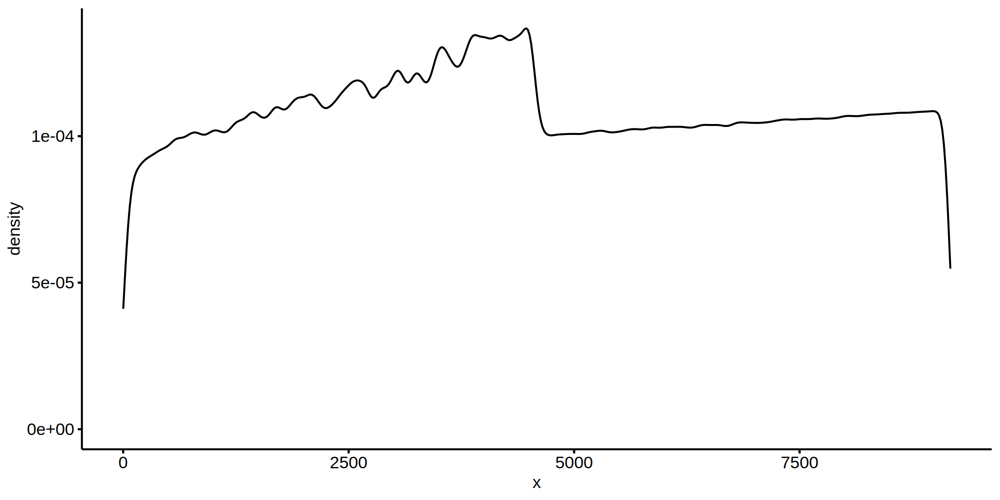

In [240]:
plotdat = melt(mtx3_ranked)
head(plotdat)
ggdensity(plotdat$value)


In [243]:
genes = unique(plotdat$variable)


In [259]:
genes[86:86]

[1] SMIM2
11899 Levels: RNF44 ...

In [263]:
1+2+3+4

[1] 10

In [262]:
rank(c(0,0,0, 9))

[1] 2 2 2
[4] 4

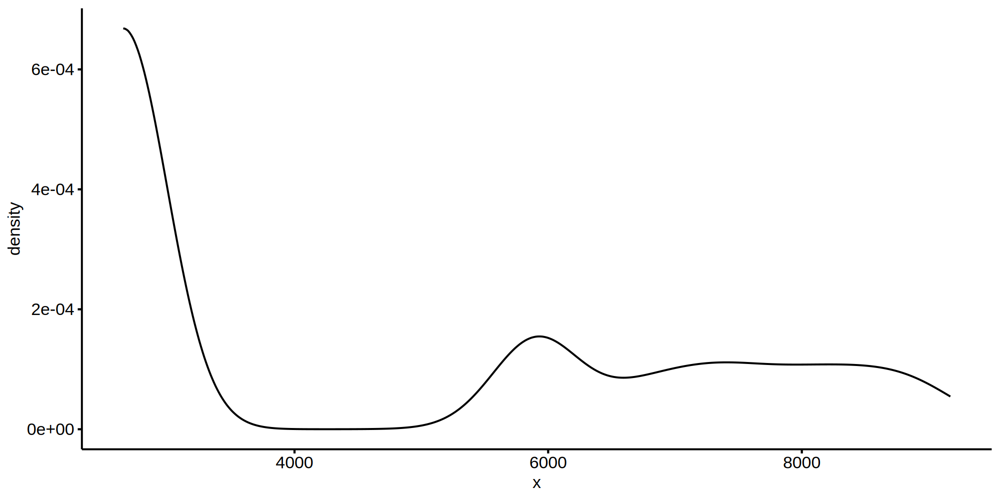

In [284]:
ggdensity(plotdat[plotdat$variable %in% genes[86:86], 'value'])


# explore the regulatory mutation impacting the gene expression

## reform the data

In [99]:
dat_ina = mc3_unique[orig_seqclass_name != mutated_seqclass_name & orig_active == T & mutated_active == F, c('Tumor_Sample_Barcode', cc), with = F]
dat_act = mc3_unique[orig_seqclass_name != mutated_seqclass_name & orig_active == F & mutated_active == T, c('Tumor_Sample_Barcode', cc), with = F]


In [100]:
dat_ina[, sampleid := substr(Tumor_Sample_Barcode, 1, 15 ) ]
dat_act[, sampleid := substr(Tumor_Sample_Barcode, 1, 15 ) ]

In [101]:
# if the sample and genes expression available
dat_ina[, if_sample := sampleid %in% rownames(mtx3_ranked) ]
dat_act[, if_sample := sampleid %in% rownames(mtx3_ranked) ]

dat_ina[, if_symbol := Hugo_Symbol %in% colnames(mtx3_ranked) ]
dat_act[, if_symbol := Hugo_Symbol %in% colnames(mtx3_ranked) ]


In [102]:
dat_ina = dat_ina[if_sample == T & if_symbol == T, ]
dat_act = dat_act[if_sample == T & if_symbol == T, ]

In [103]:
dat_ina[, tag2 := paste0(sampleid, '_', Hugo_Symbol) ]
dat_act[, tag2 := paste0(sampleid, '_', Hugo_Symbol) ]


In [224]:
dim(mtx3_ranked)
head2(mtx3_ranked)

[1] 10530
[2] 46049

,LINC02082,RP11-742D12.2,RAB4B,TIGAR,LINC01224
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-19-1787-01,3407.5,8168,5599.0,8069.5,8677.5
TCGA-S9-A7J2-01,10282.0,9017,3060.5,3809.0,6971.5
TCGA-G3-A3CH-11,3407.5,2604,450.0,289.5,971.0


In [35]:
dim(dat_ina)
dim(dat_act)


[1] 24476    13

[1] 30650    13

In [285]:
tmp = mtx3_ranked[rownames(mtx3_ranked) %in% dat_ina$sampleid, colnames(mtx3_ranked) %in% dat_ina$Hugo_Symbol]
tmp2 = as.data.table(tmp, keep.rownames = T)
tmp2 = melt(tmp2)
tmp2[, tag := paste0(rn, '_', variable) ]
setkey(tmp2, 'tag')
head(tmp2)
setkey(tmp2, 'tag')
dat_ina$rank = tmp2[dat_ina$tag2, value]

Warning message in melt.data.table(tmp2):
"id.vars and measure.vars are internally guessed when both are 'NULL'. All non-numeric/integer/logical type columns are considered id.vars, which in this case are columns [rn, ...]. Consider providing at least one of 'id' or 'measure' vars in future."


rn,variable,value,tag
<chr>,<fct>,<dbl>,<chr>
TCGA-02-0047-01,A2M,7446.5,TCGA-02-0047-01_A2M
TCGA-02-0047-01,A2ML1,5958.0,TCGA-02-0047-01_A2ML1
TCGA-02-0047-01,A4GNT,5259.0,TCGA-02-0047-01_A4GNT
TCGA-02-0047-01,AADACL2,3239.0,TCGA-02-0047-01_AADACL2
TCGA-02-0047-01,AADACL4,3671.0,TCGA-02-0047-01_AADACL4
TCGA-02-0047-01,AAGAB,2489.0,TCGA-02-0047-01_AAGAB


In [294]:
mean(rank(c(0,0,0,4)))
mean(rank(c(1,2,3,4)))

[1] 2.5

[1] 2.5

In [218]:
dim(dat_ina[!duplicated(Hugo_Symbol), ])
dim(dat_act[!duplicated(Hugo_Symbol), ])

[1] 8663
[2]   15

[1] 9819
[2]   16

In [221]:
length(intersect(unique(dat_ina$Hugo_Symbol),  unique(dat_act$Hugo_Symbol)))

[1] 6583

In [286]:
tmp = mtx3_ranked[rownames(mtx3_ranked) %in% dat_act$sampleid, colnames(mtx3_ranked) %in% dat_act$Hugo_Symbol]
tmp2 = as.data.table(tmp, keep.rownames = T)
tmp2 = melt(tmp2)
tmp2[, tag := paste0(rn, '_', variable) ]
setkey(tmp2, 'tag')
head(tmp2)
setkey(tmp2, 'tag')
dat_act$rank = tmp2[dat_act$tag2, value]

Warning message in melt.data.table(tmp2):
"id.vars and measure.vars are internally guessed when both are 'NULL'. All non-numeric/integer/logical type columns are considered id.vars, which in this case are columns [rn, ...]. Consider providing at least one of 'id' or 'measure' vars in future."


rn,variable,value,tag
<chr>,<fct>,<dbl>,<chr>
TCGA-02-0055-01,A1CF,4104.5,TCGA-02-0055-01_A1CF
TCGA-02-0055-01,A2M,8038.0,TCGA-02-0055-01_A2M
TCGA-02-0055-01,A2ML1,3719.0,TCGA-02-0055-01_A2ML1
TCGA-02-0055-01,A3GALT2,3115.5,TCGA-02-0055-01_A3GALT2
TCGA-02-0055-01,A4GNT,3881.0,TCGA-02-0055-01_A4GNT
TCGA-02-0055-01,AADAC,3361.0,TCGA-02-0055-01_AADAC


In [287]:
dat_act = dat_act[order(rank, decreasing = T), ]
dat_ina = dat_ina[order(rank, decreasing = F), ]

Tumor_Sample_Barcode,tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC,sampleid,if_sample,if_symbol,tag2,rank,xx,set
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<chr>,<dbl>,<int>,<chr>
TCGA-VQ-A8P5-01A-11D-A397-08,7_143747527_143747527_A,OR2A5,Missense_Mutation,SNP,TCGA-STAD,HET3 Heterochromatin,TF4 OTX2,p.F11L,Unknown,TCGA-VQ-A8P5-01,TRUE,TRUE,TCGA-VQ-A8P5-01_OR2A5,9171,1,activate
TCGA-A8-A06R-01A-11D-A015-09,6_167453443_167453443_A,FGFR1OP,Missense_Mutation,SNP,TCGA-BRCA,HET3 Heterochromatin,E6 Weak epithelial,p.D393N,Unknown,TCGA-A8-A06R-01,TRUE,TRUE,TCGA-A8-A06R-01_FGFR1OP,9170,2,activate
TCGA-D8-A1XK-01A-21D-A14K-09,15_101718063_101718063_C,CHSY1,Missense_Mutation,SNP,TCGA-BRCA,L1 Low signal,E12 Erythroblast-like,p.N647D,Unknown,TCGA-D8-A1XK-01,TRUE,TRUE,TCGA-D8-A1XK-01_CHSY1,9170,3,activate
TCGA-EE-A2GO-06A-11D-A196-08,18_61654354_61654354_A,SERPINB8,Missense_Mutation,SNP,TCGA-SKCM,PC1 Polycomb / Heterochromatin,E6 Weak epithelial,p.E323K,Unknown,TCGA-EE-A2GO-06,TRUE,TRUE,TCGA-EE-A2GO-06_SERPINB8,9169,7,activate
TCGA-85-7950-01A-11D-2184-08,8_42196536_42196536_T,POLB,Missense_Mutation,SNP,TCGA-LUSC,HET4 Heterochromatin,TF5 AR,p.A23V,Unknown,TCGA-85-7950-01,TRUE,TRUE,TCGA-85-7950-01_POLB,9168,4,activate
TCGA-A2-A04X-01A-21W-A050-09,1_155629578_155629578_T,YY1AP1,Missense_Mutation,SNP,TCGA-BRCA,HET3 Heterochromatin,E12 Erythroblast-like,p.G846E,Unknown,TCGA-A2-A04X-01,TRUE,TRUE,TCGA-A2-A04X-01_YY1AP1,9168,5,activate


## overall gene expression changes with predicted regulatory functional mutations

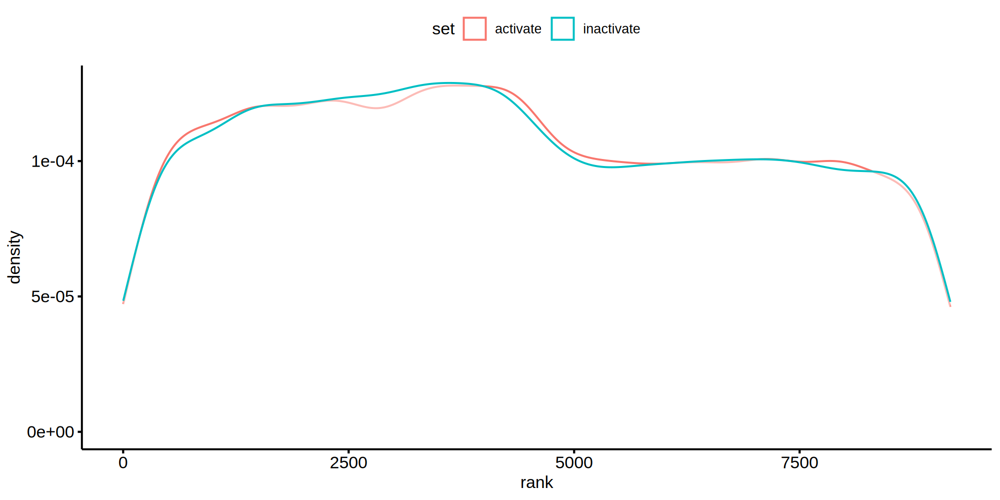

In [290]:
dat_act$set = 'activate'
dat_ina$set = 'inactivate'
plotdat = rbind(dat_act[, .(set, rank)], dat_ina[, .(set, rank)])
ggdensity(plotdat, x = 'rank', col = 'set')

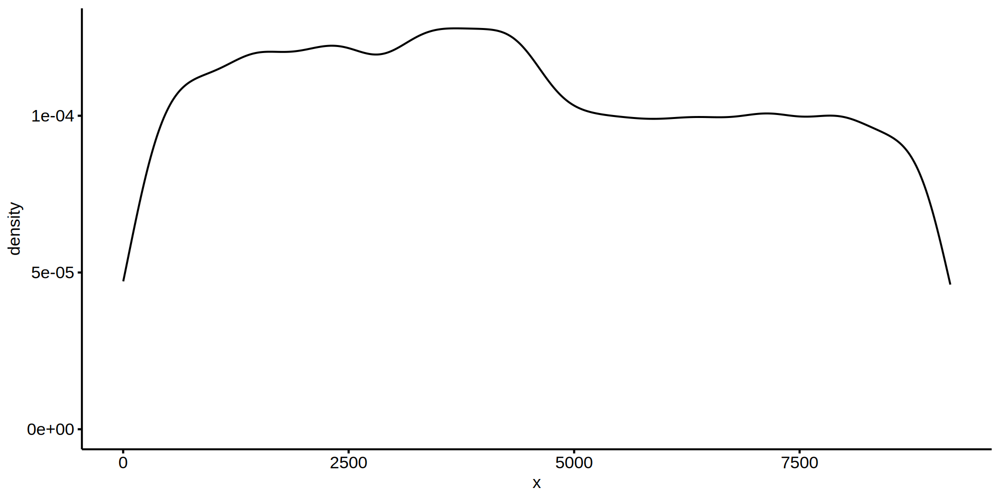

In [288]:
ggdensity(dat_act$rank)
ggdensity(dat_ina$rank)

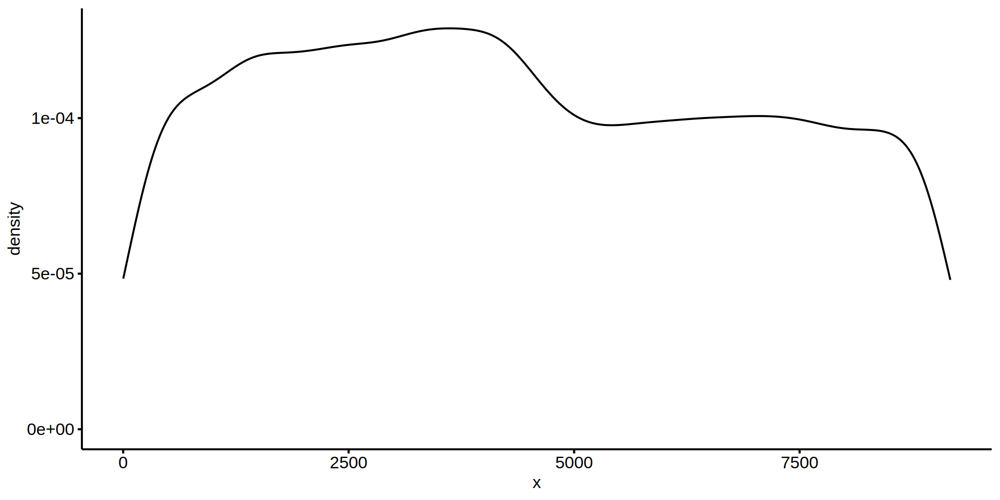

In [230]:
dim(mtx3_ranked)
head2(mtx3_ranked)

[1] 10530
[2] 46049

,LINC02082,RP11-742D12.2,RAB4B,TIGAR,LINC01224
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
TCGA-19-1787-01,3407.5,8168,5599.0,8069.5,8677.5
TCGA-S9-A7J2-01,10282.0,9017,3060.5,3809.0,6971.5
TCGA-G3-A3CH-11,3407.5,2604,450.0,289.5,971.0


Warning message in melt.default(mtx3_ranked):
"The melt generic in data.table has been passed a data.frame and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(mtx3_ranked). In the next version, this warning will become an error."
No id variables; using all as measure variables



,variable,value
,<fct>,<dbl>
1,LINC02082,3407.5
2,LINC02082,10282.0
3,LINC02082,3407.5
4,LINC02082,3407.5
5,LINC02082,3407.5
6,LINC02082,3407.5


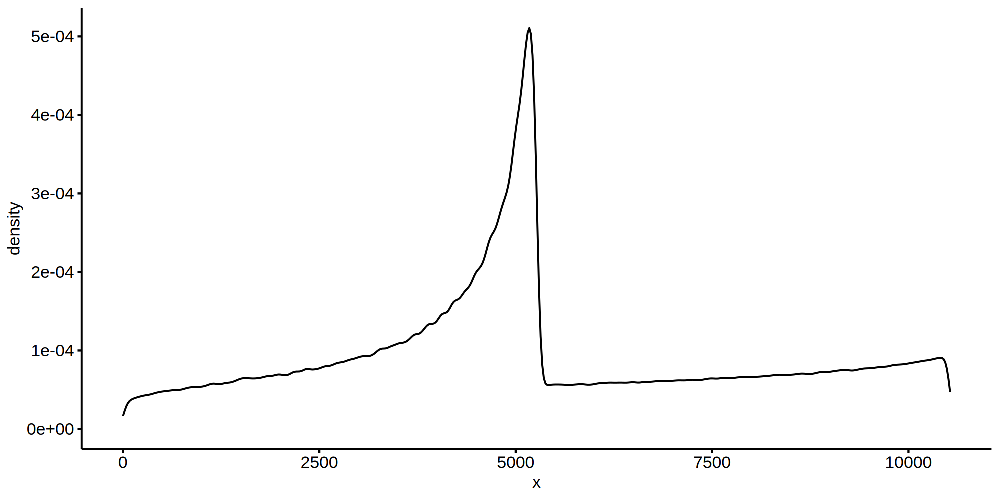

In [232]:
plotdat = melt(mtx3_ranked)
head(plotdat)
ggdensity(plotdat$value)


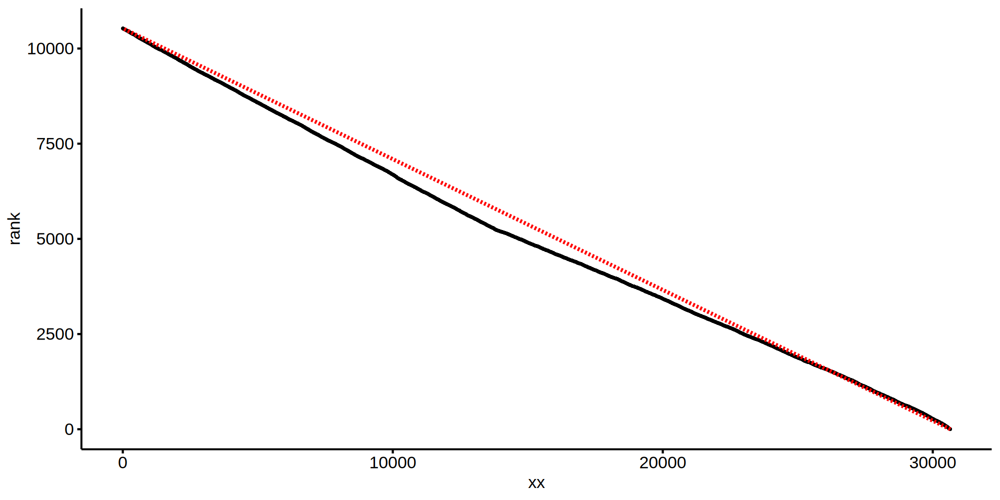

In [211]:
dat_act[, xx := 1:nrow(dat_act) ]
options(repr.plot.width = 10, repr.plot.height = 5, res = 200)
ggscatter(dat_act, x = 'xx', y = 'rank', size = .2) + 
  annotate("segment", x = 30650, y = 0, xend = 0, yend = 10530, 
           color = "red", linetype = "dashed", size = 1)


## individual mutations

In [296]:
head(dat_act)


Tumor_Sample_Barcode,tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC,sampleid,if_sample,if_symbol,tag2,rank,xx,set
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<chr>,<dbl>,<int>,<chr>
TCGA-VQ-A8P5-01A-11D-A397-08,7_143747527_143747527_A,OR2A5,Missense_Mutation,SNP,TCGA-STAD,HET3 Heterochromatin,TF4 OTX2,p.F11L,Unknown,TCGA-VQ-A8P5-01,TRUE,TRUE,TCGA-VQ-A8P5-01_OR2A5,9171,1,activate
TCGA-A8-A06R-01A-11D-A015-09,6_167453443_167453443_A,FGFR1OP,Missense_Mutation,SNP,TCGA-BRCA,HET3 Heterochromatin,E6 Weak epithelial,p.D393N,Unknown,TCGA-A8-A06R-01,TRUE,TRUE,TCGA-A8-A06R-01_FGFR1OP,9170,2,activate
TCGA-D8-A1XK-01A-21D-A14K-09,15_101718063_101718063_C,CHSY1,Missense_Mutation,SNP,TCGA-BRCA,L1 Low signal,E12 Erythroblast-like,p.N647D,Unknown,TCGA-D8-A1XK-01,TRUE,TRUE,TCGA-D8-A1XK-01_CHSY1,9170,3,activate
TCGA-EE-A2GO-06A-11D-A196-08,18_61654354_61654354_A,SERPINB8,Missense_Mutation,SNP,TCGA-SKCM,PC1 Polycomb / Heterochromatin,E6 Weak epithelial,p.E323K,Unknown,TCGA-EE-A2GO-06,TRUE,TRUE,TCGA-EE-A2GO-06_SERPINB8,9169,7,activate
TCGA-85-7950-01A-11D-2184-08,8_42196536_42196536_T,POLB,Missense_Mutation,SNP,TCGA-LUSC,HET4 Heterochromatin,TF5 AR,p.A23V,Unknown,TCGA-85-7950-01,TRUE,TRUE,TCGA-85-7950-01_POLB,9168,4,activate
TCGA-A2-A04X-01A-21W-A050-09,1_155629578_155629578_T,YY1AP1,Missense_Mutation,SNP,TCGA-BRCA,HET3 Heterochromatin,E12 Erythroblast-like,p.G846E,Unknown,TCGA-A2-A04X-01,TRUE,TRUE,TCGA-A2-A04X-01_YY1AP1,9168,5,activate


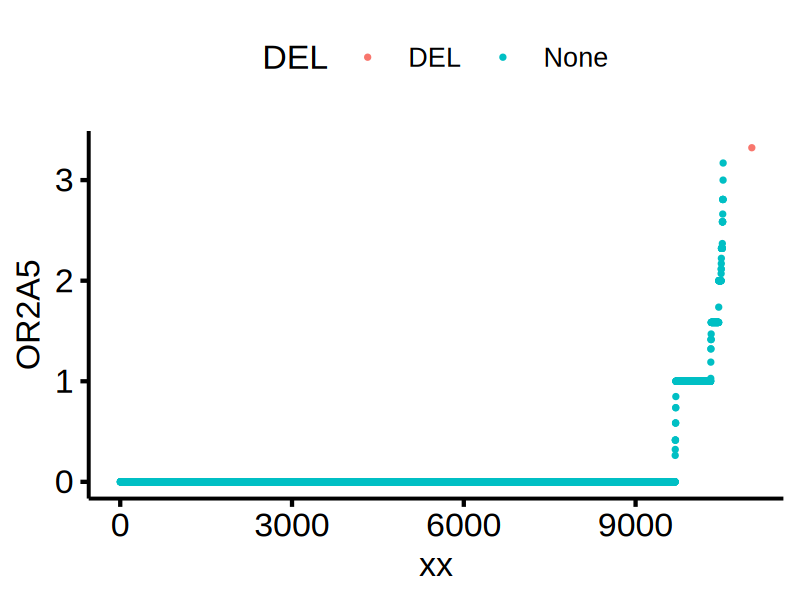

In [311]:
ii = 1
gene_ii = dat_act[ii, Hugo_Symbol] #'OR2A5'
sample_ii = dat_act[ii, sampleid] #'TCGA-VQ-A8P5-01'

plotdat = as.data.table(mtx3[, c(gene_ii, 'GAPDH')], keep.rownames = T)
plotdat = plotdat[order(get(gene_ii)), ]
#plotdat = plotdat[get(gene_ii)> 5, ]
plotdat[, xx := 1:nrow(plotdat) ]

plotdat[, DEL := 'None'] 
plotdat[rn %in% sample_ii, DEL := 'DEL'] 
plotdat[rn %in% sample_ii, xx := xx + 500 ]

options(repr.plot.width = 4, repr.plot.height = 3, repr.plot.res = 200)
ggscatter(plotdat, x = 'xx', y = gene_ii, color = 'DEL', size = .3) 


## PIK3CA example

In [193]:
dat_act[Hugo_Symbol == 'PIK3CA' & Variant_Type == 'DEL', cc, with = F]
dat_act[Hugo_Symbol == 'PIK3CA', cc, with = F]

tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
3_178916922_178916930_-,PIK3CA,In_Frame_Del,DEL,TCGA-BRCA,L1 Low signal,TF2 CEBPB,p.E103_G106delinsD,Likely Oncogenic
3_178928072_178928098_-,PIK3CA,In_Frame_Del,DEL,,L1 Low signal,TF1 NANOG / FOXA1,p.L452_G460del,Oncogenic
3_178928067_178928093_-,PIK3CA,In_Frame_Del,DEL,TCGA-BRCA,L1 Low signal,TF1 NANOG / FOXA1,p.H450_P458del,Oncogenic


tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
3_178916922_178916930_-,PIK3CA,In_Frame_Del,DEL,TCGA-BRCA,L1 Low signal,TF2 CEBPB,p.E103_G106delinsD,Likely Oncogenic
3_178928072_178928098_-,PIK3CA,In_Frame_Del,DEL,,L1 Low signal,TF1 NANOG / FOXA1,p.L452_G460del,Oncogenic
3_178937410_178937410_A,PIK3CA,Missense_Mutation,SNP,TCGA-LUAD,L1 Low signal,TF1 NANOG / FOXA1,p.E600K,Likely Oncogenic
3_178928067_178928093_-,PIK3CA,In_Frame_Del,DEL,TCGA-BRCA,L1 Low signal,TF1 NANOG / FOXA1,p.H450_P458del,Oncogenic
3_178952018_178952018_G,PIK3CA,Missense_Mutation,SNP,TCGA-COAD,L1 Low signal,E6 Weak epithelial,p.T1025A,Likely Oncogenic
3_178916861_178916861_C,PIK3CA,Missense_Mutation,SNP,TCGA-BRCA,L1 Low signal,TF2 CEBPB,p.F83S,Unknown
3_178936017_178936017_T,PIK3CA,Missense_Mutation,SNP,,L1 Low signal,TF1 NANOG / FOXA1,p.D520V,Unknown
3_178928225_178928225_G,PIK3CA,Missense_Mutation,SNP,TCGA-BLCA,L1 Low signal,TF1 NANOG / FOXA1,p.P471A,Likely Oncogenic
3_178952054_178952054_A,PIK3CA,Missense_Mutation,SNP,,L1 Low signal,E6 Weak epithelial,p.E1037K,Likely Oncogenic


In [178]:
plotdat = mc3[Hugo_Symbol == 'PIK3CA' & Variant_Type == 'DEL', c('Tumor_Sample_Barcode', 'Hugo_Symbol', 'Variant_Classification', 'Variant_Type', 'project_id', 'HGVSp_Short'), with = F] 
datatable(plotdat)
# The C2 domain of PIK3CA (p110α subunit of PI3K) typically spans amino acids ~324 to 487 based on UniProt (P42336) and structural studies. This domain plays a key role in membrane binding and interacts with phospholipids.
hgvsp = c('p.E453_G460delinsDDF',  'p.L455_G463del',  'p.X463_splice', 'p.E453_L455del', 'p.H450_P458del', 'p.P447_L455del',
          'p.G463_N465delinsD', 'p.L452_G460del', 'p.G451_D454del', 'p.P447_L455del', 'p.P447_L455del', 'p.E453del', 'p.E453del')

HTML widgets cannot be represented in plain text (need html)

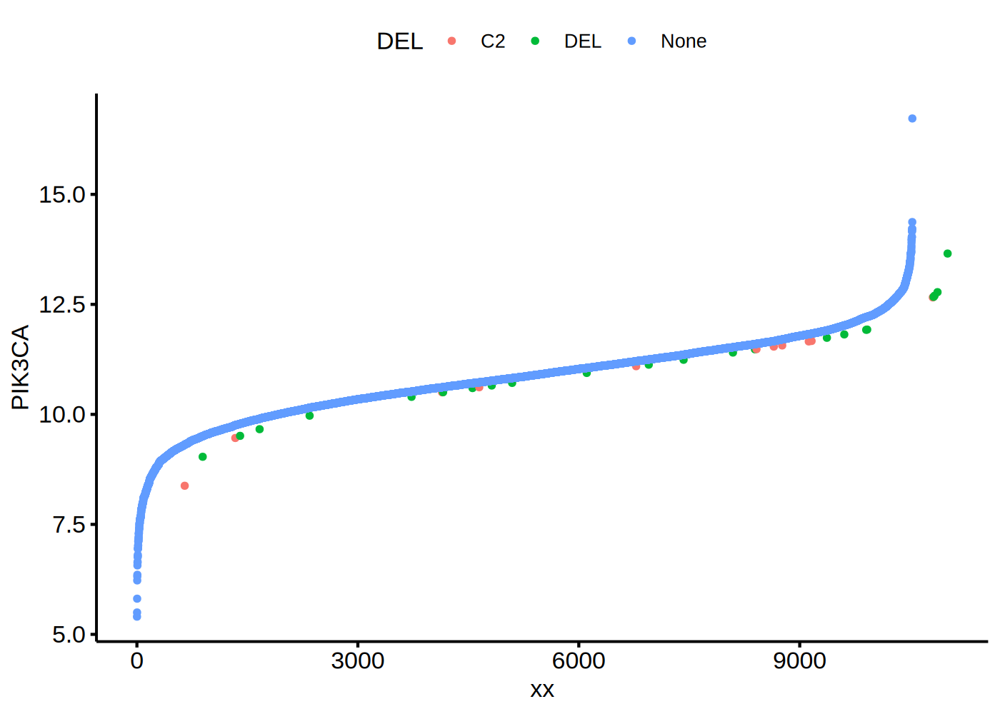

In [182]:
plotdat = mc3[Hugo_Symbol == 'PIK3CA' & Variant_Type == 'DEL', c('Tumor_Sample_Barcode', 'Hugo_Symbol', 'Variant_Classification', 'Variant_Type', 'project_id', 'HGVSp_Short'), with = F] 
sampleid_sel = substr(plotdat$Tumor_Sample_Barcode, 1, 15)

plotdat = mc3[Hugo_Symbol == 'PIK3CA' & Variant_Type == 'DEL' & HGVSp_Short %in% hgvsp, c('Tumor_Sample_Barcode', 'Hugo_Symbol', 'Variant_Classification', 'Variant_Type', 'project_id', 'HGVSp_Short'), with = F] 
c2_sampleid =  substr(plotdat$Tumor_Sample_Barcode, 1, 15)

plotdat = as.data.table(mtx3[, c('PIK3CA', 'GAPDH')], keep.rownames = T)
plotdat = plotdat[order(PIK3CA), ]
plotdat = plotdat[PIK3CA > 5, ]
plotdat[, xx := 1:nrow(plotdat) ]

plotdat[, DEL := 'None'] 
plotdat[rn %in% sampleid_sel, DEL := 'DEL'] 
plotdat[rn %in% c2_sampleid, DEL := 'C2' ]
plotdat[rn %in% sampleid_sel, xx := xx + 500 ]


ggscatter(plotdat, x = 'xx', y = 'PIK3CA', color = 'DEL', size = 1) 


In [167]:
length(sampleid_sel)

[1] 48

In [190]:
dat_act[Hugo_Symbol == 'PIK3CA' & Variant_Type == 'DEL', c('sampleid', cc), with = F]

sampleid,tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
TCGA-C8-A26X-01,3_178916922_178916930_-,PIK3CA,In_Frame_Del,DEL,TCGA-BRCA,L1 Low signal,TF2 CEBPB,p.E103_G106delinsD,Likely Oncogenic
TCGA-BH-A201-01,3_178928072_178928098_-,PIK3CA,In_Frame_Del,DEL,,L1 Low signal,TF1 NANOG / FOXA1,p.L452_G460del,Oncogenic
TCGA-A8-A07J-01,3_178928067_178928093_-,PIK3CA,In_Frame_Del,DEL,TCGA-BRCA,L1 Low signal,TF1 NANOG / FOXA1,p.H450_P458del,Oncogenic


In [192]:
head(plotdat[rn %in% del_sampleid, ] )
tail(plotdat)

rn,PIK3CA,GAPDH,xx,DEL
<chr>,<dbl>,<dbl>,<int>,<chr>
TCGA-A8-A07J-01,11.6572,15.7199,9123,DEL
TCGA-BH-A201-01,12.6581,16.8232,10807,DEL
TCGA-C8-A26X-01,13.6553,18.6181,11008,DEL


rn,PIK3CA,GAPDH,xx,DEL
<chr>,<dbl>,<dbl>,<int>,<chr>
TCGA-34-5231-01,14.1604,19.1547,10524,None
TCGA-66-2792-01,14.1690,18.6951,10525,None
TCGA-22-5477-01,14.2168,19.9190,10526,None
TCGA-CD-8526-01,14.2221,18.3153,10527,None
TCGA-D3-A51G-06,14.3715,18.3689,10528,None
TCGA-A2-A04P-01,16.7256,18.7319,10529,None


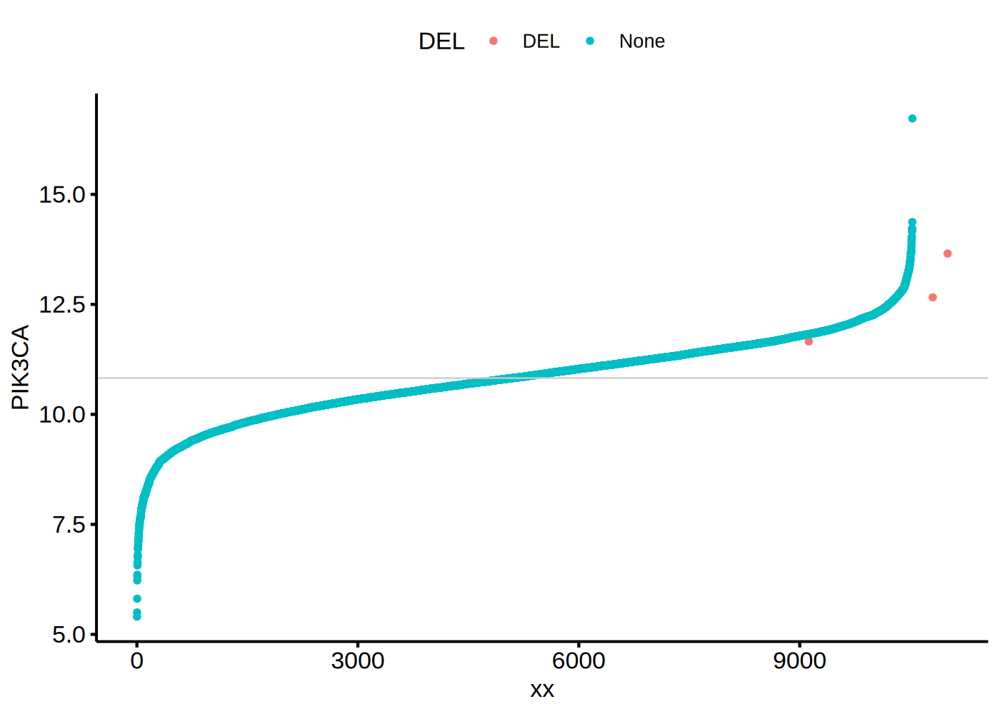

In [186]:
plotdat = as.data.table(mtx3[, c('PIK3CA', 'GAPDH')], keep.rownames = T)
plotdat = plotdat[order(PIK3CA), ]
plotdat = plotdat[PIK3CA > 5, ]
plotdat[, xx := 1:nrow(plotdat) ]

plotdat[, DEL := 'None'] 
del_sampleid = dat_act[Hugo_Symbol == 'PIK3CA' & Variant_Type == 'DEL', sampleid]
plotdat[rn %in% del_sampleid, DEL := 'DEL'] 
plotdat[rn %in% del_sampleid, xx := xx + 500 ]

ggscatter(plotdat, x = 'xx', y = 'PIK3CA', color = 'DEL', size = 1) +
  geom_hline(yintercept = mean(plotdat$PIK3CA), color = "grey80", size = .3)


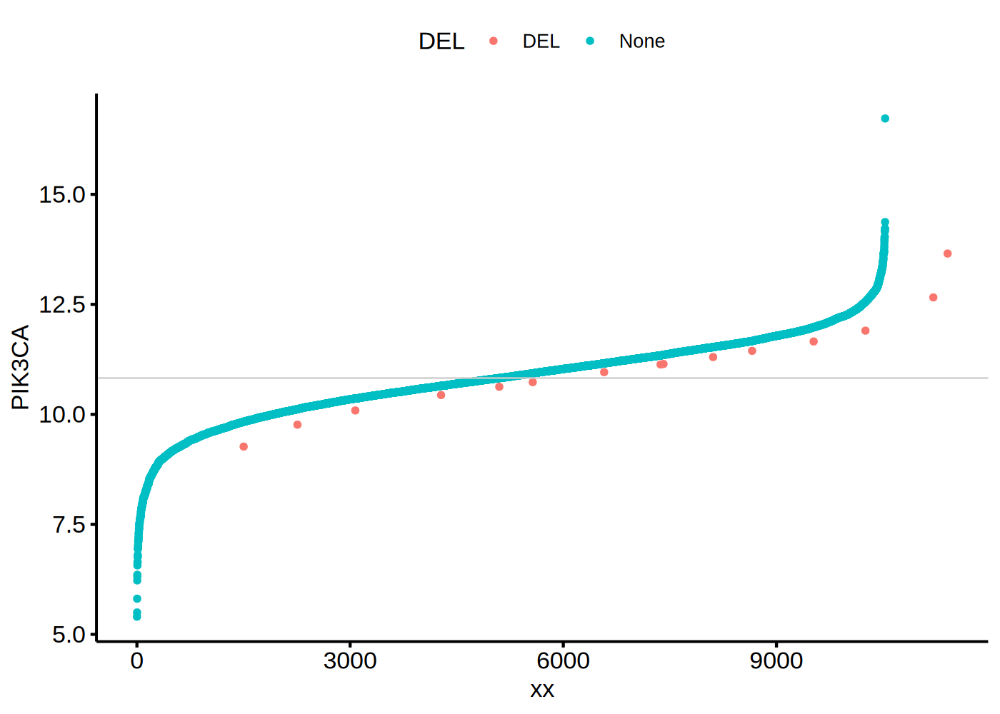

In [195]:
plotdat = as.data.table(mtx3[, c('PIK3CA', 'GAPDH')], keep.rownames = T)
plotdat = plotdat[order(PIK3CA), ]
plotdat = plotdat[PIK3CA > 5, ]
plotdat[, xx := 1:nrow(plotdat) ]

plotdat[, DEL := 'None'] 
del_sampleid = dat_act[Hugo_Symbol == 'PIK3CA', sampleid]
plotdat[rn %in% del_sampleid, DEL := 'DEL'] 
plotdat[rn %in% del_sampleid, xx := xx + 900 ]

ggscatter(plotdat, x = 'xx', y = 'PIK3CA', color = 'DEL', size = 1) +
  geom_hline(yintercept = mean(plotdat$PIK3CA), color = "grey80", size = .3)


In [196]:
dat_act[Hugo_Symbol == 'PIK3CA', ]

Tumor_Sample_Barcode,tag,Hugo_Symbol,Variant_Classification,Variant_Type,project_id,orig_seqclass_name,mutated_seqclass_name,HGVSp_Short,ONCOGENIC,sampleid,if_sample,if_symbol,tag2,rank
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<lgl>,<lgl>,<chr>,<dbl>
TCGA-C8-A26X-01A-31D-A16D-09,3_178916922_178916930_-,PIK3CA,In_Frame_Del,DEL,TCGA-BRCA,L1 Low signal,TF2 CEBPB,p.E103_G106delinsD,Likely Oncogenic,TCGA-C8-A26X-01,TRUE,TRUE,TCGA-C8-A26X-01_PIK3CA,10509.0
TCGA-BH-A201-01A-11D-A14K-09,3_178928072_178928098_-,PIK3CA,In_Frame_Del,DEL,,L1 Low signal,TF1 NANOG / FOXA1,p.L452_G460del,Oncogenic,TCGA-BH-A201-01,TRUE,TRUE,TCGA-BH-A201-01_PIK3CA,10308.0
TCGA-44-7670-01A-11D-2063-08,3_178937410_178937410_A,PIK3CA,Missense_Mutation,SNP,TCGA-LUAD,L1 Low signal,TF1 NANOG / FOXA1,p.E600K,Likely Oncogenic,TCGA-44-7670-01,TRUE,TRUE,TCGA-44-7670-01_PIK3CA,9353.0
TCGA-A8-A07J-01A-11W-A019-09,3_178928067_178928093_-,PIK3CA,In_Frame_Del,DEL,TCGA-BRCA,L1 Low signal,TF1 NANOG / FOXA1,p.H450_P458del,Oncogenic,TCGA-A8-A07J-01,TRUE,TRUE,TCGA-A8-A07J-01_PIK3CA,8625.0
TCGA-A6-6781-01A-22D-A270-10,3_178952018_178952018_G,PIK3CA,Missense_Mutation,SNP,TCGA-COAD,L1 Low signal,E6 Weak epithelial,p.T1025A,Likely Oncogenic,TCGA-A6-6781-01,TRUE,TRUE,TCGA-A6-6781-01_PIK3CA,7758.0
TCGA-XX-A899-01A-11D-A36J-09,3_178916861_178916861_C,PIK3CA,Missense_Mutation,SNP,TCGA-BRCA,L1 Low signal,TF2 CEBPB,p.F83S,Unknown,TCGA-XX-A899-01,TRUE,TRUE,TCGA-XX-A899-01_PIK3CA,7208.5
TCGA-AR-A2LO-01A-31D-A18P-09,3_178936017_178936017_T,PIK3CA,Missense_Mutation,SNP,,L1 Low signal,TF1 NANOG / FOXA1,p.D520V,Unknown,TCGA-AR-A2LO-01,TRUE,TRUE,TCGA-AR-A2LO-01_PIK3CA,6511.0
TCGA-FD-A3NA-01A-11D-A21A-08,3_178928225_178928225_G,PIK3CA,Missense_Mutation,SNP,TCGA-BLCA,L1 Low signal,TF1 NANOG / FOXA1,p.P471A,Likely Oncogenic,TCGA-FD-A3NA-01,TRUE,TRUE,TCGA-FD-A3NA-01_PIK3CA,6470.0
TCGA-BH-A18H-01A-11D-A12B-09,3_178952054_178952054_A,PIK3CA,Missense_Mutation,SNP,,L1 Low signal,E6 Weak epithelial,p.E1037K,Likely Oncogenic,TCGA-BH-A18H-01,TRUE,TRUE,TCGA-BH-A18H-01_PIK3CA,5676.5


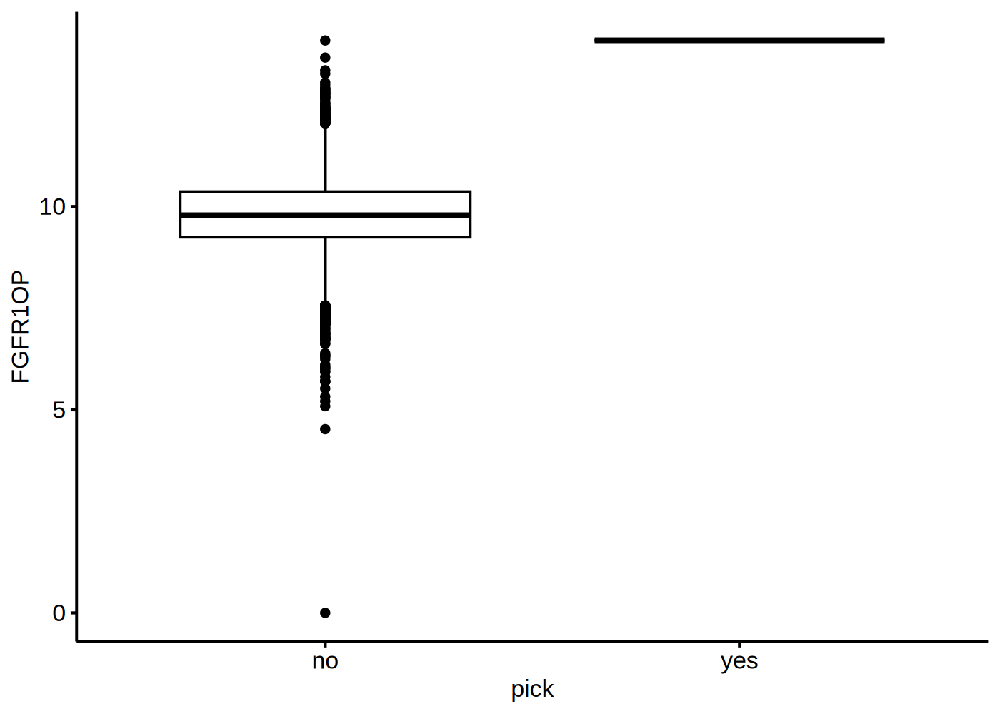

In [110]:
ii = 2
sample_ii = dat_act[ii, sampleid]
symbol_ii = dat_act[ii, Hugo_Symbol]
plotdat = as.data.table(mtx3[, symbol_ii, drop = F], keep.rownames = T)
plotdat[, pick := 'no' ]
plotdat[rn %in% sample_ii,  pick := 'yes' ]
ggboxplot(plotdat, x = 'pick', y = symbol_ii)
